In [1]:
import perturbseq_analysis as pseq
from scipy.io import mmread
import pandas as pd
import xlrd

In [20]:
# Fetching the matrix counts; rows are cells and columns are genes
matrix = mmread('GSE161824_A549_KRAS.rawcounts.matrix.mtx')  # This file was too big to be stores in GitHub; please download it from https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE161824
matrix = matrix.todense()
matrix = pd.DataFrame(matrix)
matrix

,0,1,2,3,4,5,6,7,8,9,...,24481,24482,24483,24484,24485,24486,24487,24488,24489,24490
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150039,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
150040,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
150041,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
150042,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [3]:
# Loading the metadata with the genes (HGNC nomenclature) assigned to each column
var_names = pd.read_csv('GSE161824_A549_KRAS.rawcounts.genes.csv', header = None)[0]
var_names

0        RP11-34P13.7
1        RP11-34P13.8
2          FO538757.3
3          FO538757.2
4          AP006222.2
             ...     
24486      AC007325.2
24487      AL354822.1
24488      AC023491.2
24489      AC004556.1
24490      AC240274.1
Name: 0, Length: 24491, dtype: object

In [4]:
# Loading the metadata with the variants assigned to each cell (rows)
obs_names = pd.read_csv('GSE161824_A549_KRAS.variants2cell.csv', sep = '\t')['variant']
obs_names

0         unassigned
1               T50T
2         unassigned
3         unassigned
4              T127T
             ...    
150039         M170L
150040          Q99E
150041          G13R
150042         Y166H
150043          T20R
Name: variant, Length: 150044, dtype: object

In [5]:
# Fetching the names of mitochondrial genes (downloaded from MitoCarta3.0 database)
mt_names = pd.read_excel('Human.MitoCarta3.0.xls', 'A Human MitoCarta3.0')['Symbol']
mt_names

0                CYC1
1                SDHB
2                COQ7
3                SDHA
4              UQCRC1
            ...      
1131            NAT8L
1132            MCCD1
1133          PIGBOS1
1134             HTD2
1135    RP11_469A15.2
Name: Symbol, Length: 1136, dtype: object

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


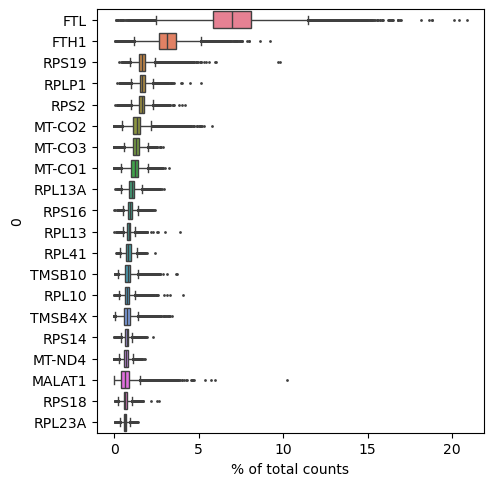

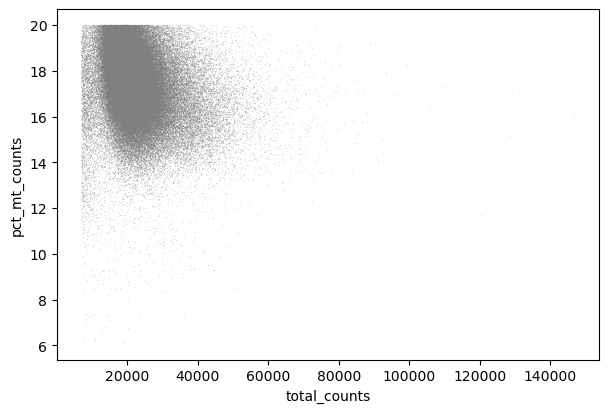

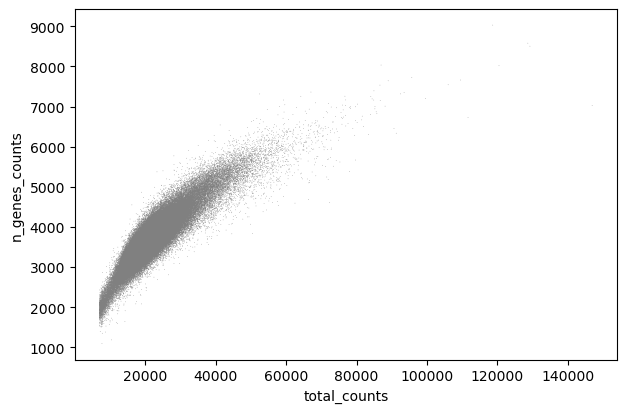

Execution time: 264.564 seconds


In [6]:
# Filtering data; check the documentation for more info
adata = pseq.filter_data(matrix, var_names, obs_names, mt_names)

In [3]:
##### CHECKPOINT: Recover output from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/filter_data.pkl', 'rb') as file:
    adata = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/filter_data.pkl', 'rb') as file:\n    adata = pkl.load(file)\n"

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n is deprecated and will be removed in Python 3.14; use value instead
  return node.n
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n is deprecated and will be removed in Python 3.14; use value instead
  return node.n


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


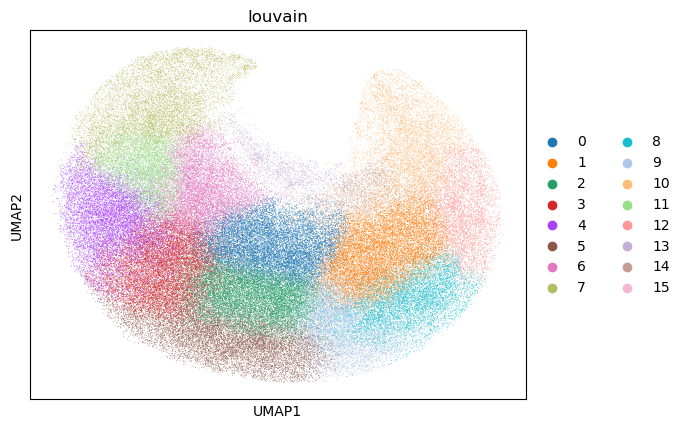

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
T74A,12.44,12.44,13.17,8.05,9.39,5.98,6.34,5.49,5.24,5.12,4.88,5.0,3.9,0.61,1.95,0.0
T127T,8.55,10.78,12.1,8.62,7.58,11.27,5.7,4.31,6.75,7.09,4.52,3.27,5.49,2.16,1.81,0.0
M170L,8.04,11.75,10.95,10.34,6.98,8.75,4.77,4.86,7.77,8.83,4.68,3.53,6.18,1.24,1.33,0.0
L79I,9.58,13.43,10.76,8.88,6.71,7.4,5.03,5.43,8.19,8.39,4.74,3.46,5.43,1.48,0.99,0.1
K178K,8.53,10.64,9.18,8.82,7.29,9.4,6.41,5.69,8.97,6.63,5.69,4.52,5.32,1.46,1.38,0.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E63K,10.6,12.62,9.67,10.6,6.64,7.91,5.13,5.47,6.64,7.06,4.04,5.21,5.63,1.6,1.09,0.08
K176Q,9.46,12.16,12.99,9.56,6.34,8.0,5.93,4.89,7.8,6.96,4.16,3.64,4.78,1.66,1.46,0.21
A59E,16.0,8.44,11.22,8.89,6.78,5.56,12.78,7.44,3.56,4.56,4.11,6.11,1.56,1.78,1.22,0.0
G12S,15.38,14.29,12.97,8.35,4.62,4.18,9.89,4.18,5.93,6.15,4.4,4.84,2.2,1.32,1.32,0.0


Execution time: 306.328 seconds


In [8]:
# Louvain clustering of cells, and calculate the variant presence (%) in each louvain group
adata = pseq.louvain_cells(adata)

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


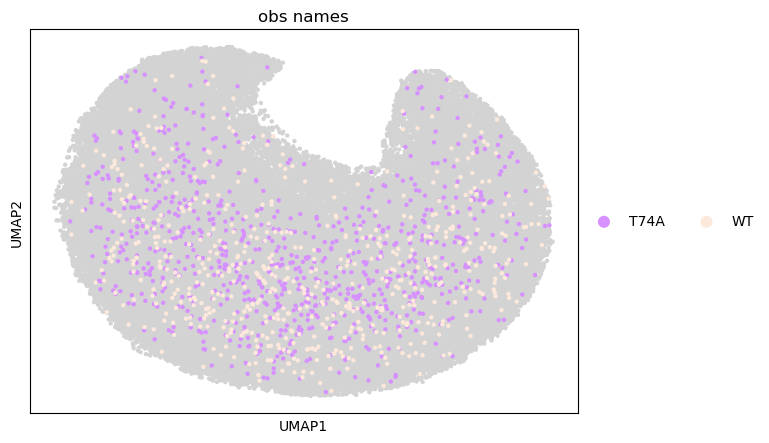

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


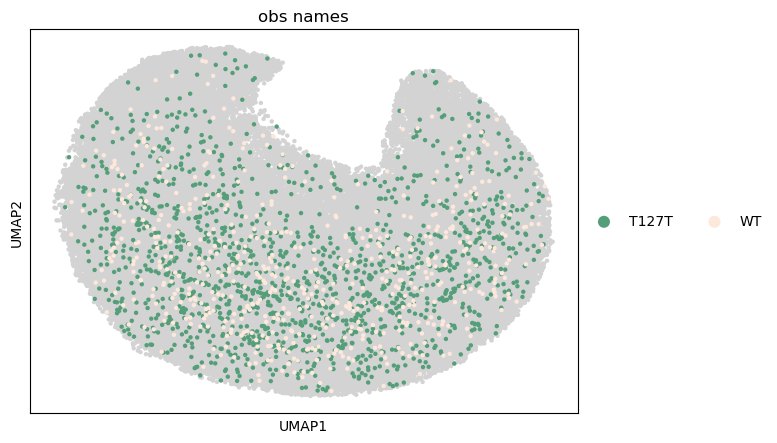

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


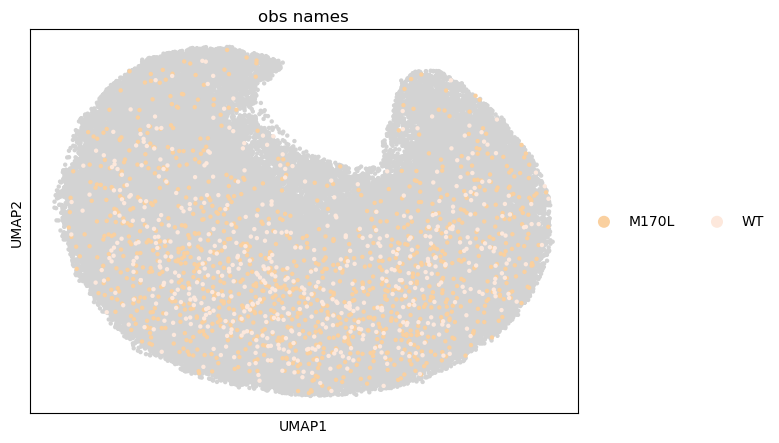

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


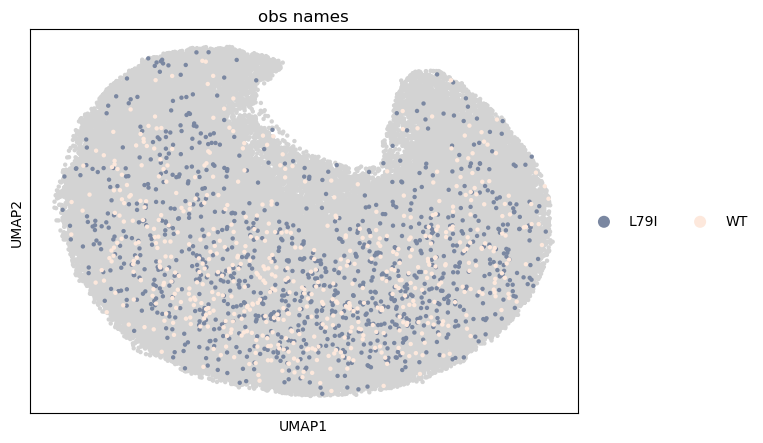

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


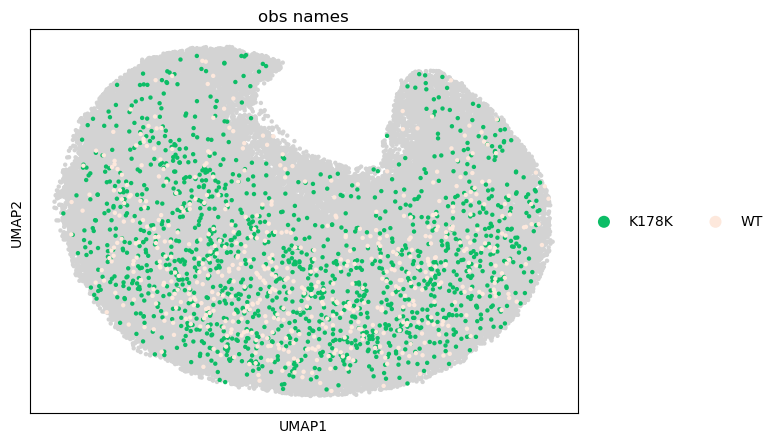

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


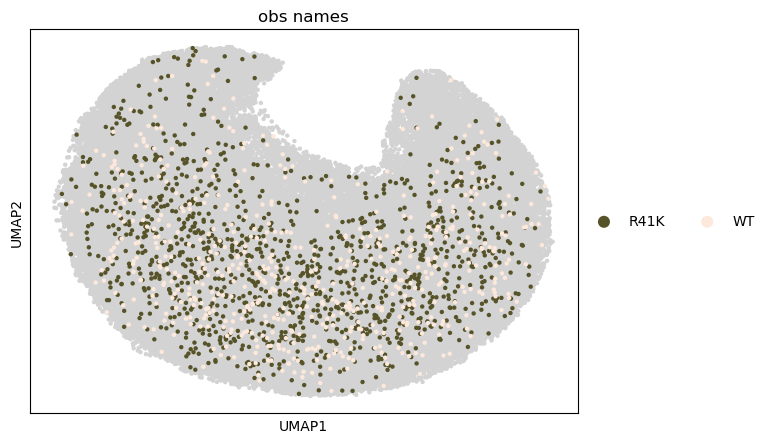

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


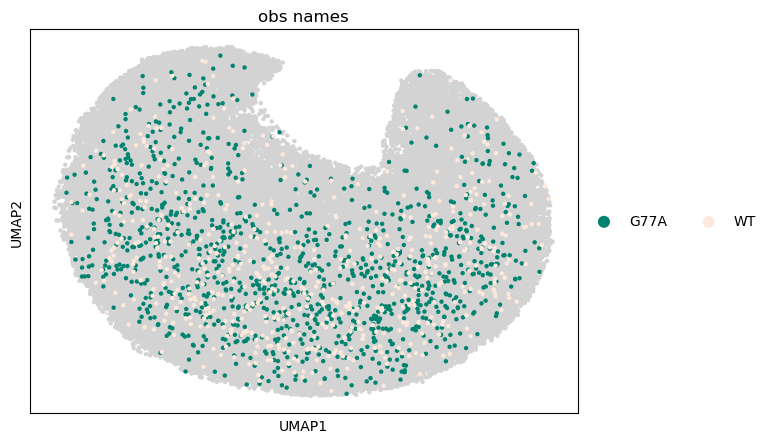

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


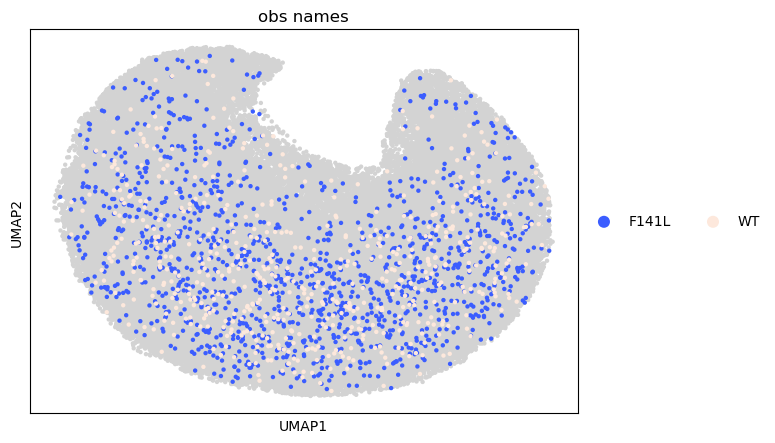

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


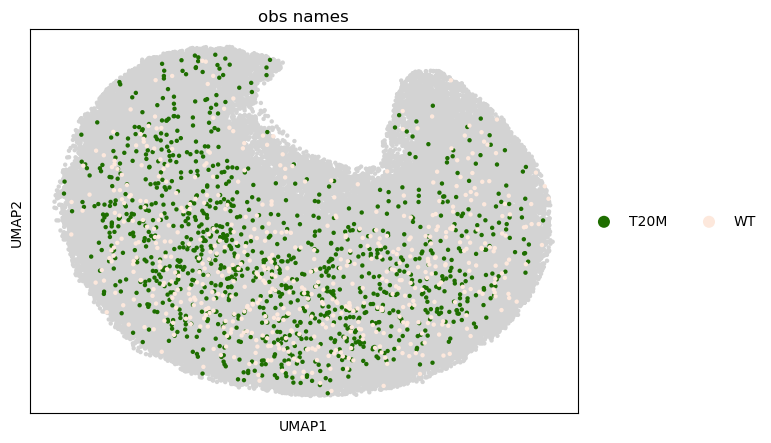

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


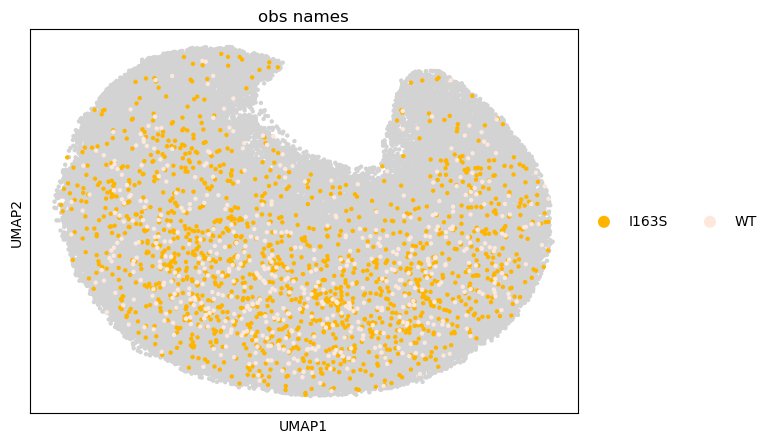

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


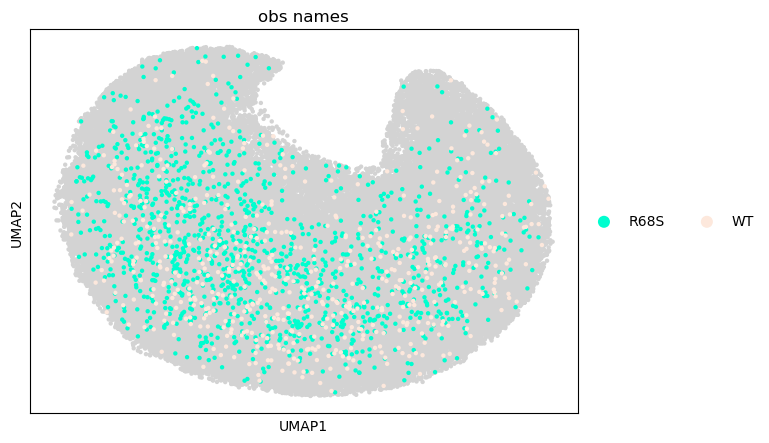

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


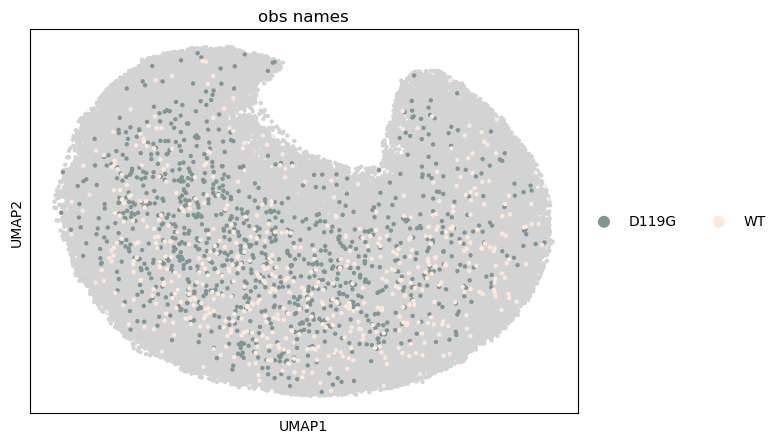

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


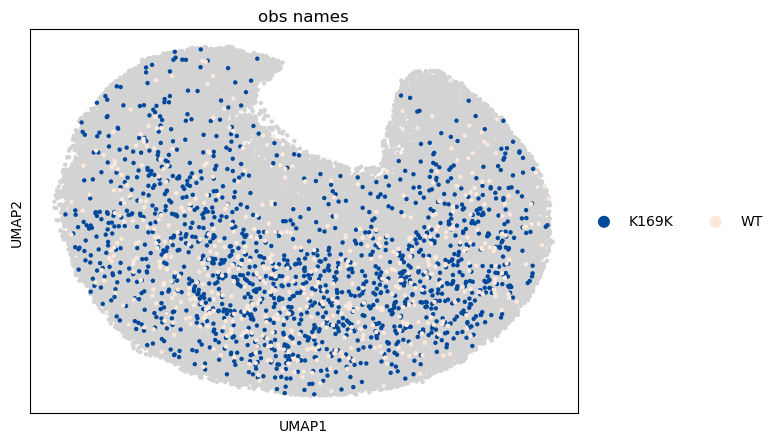

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


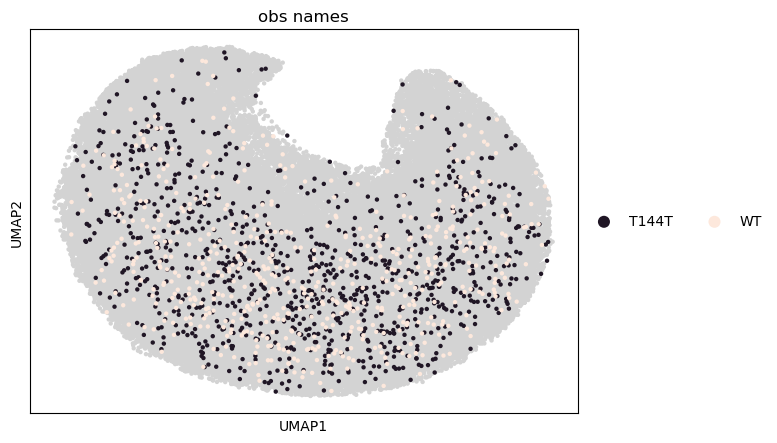

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


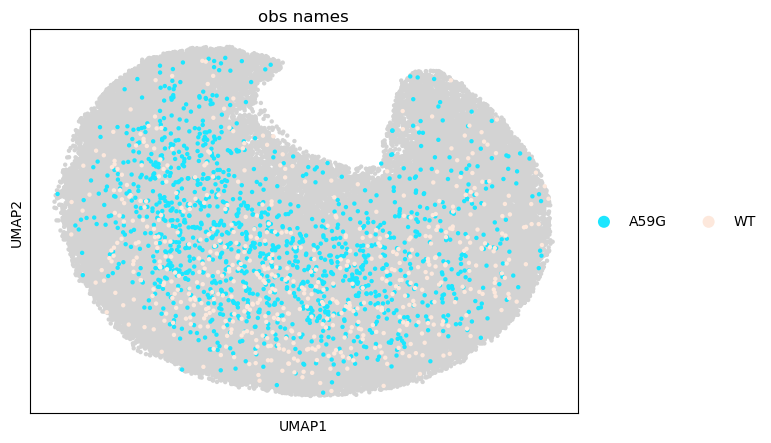

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


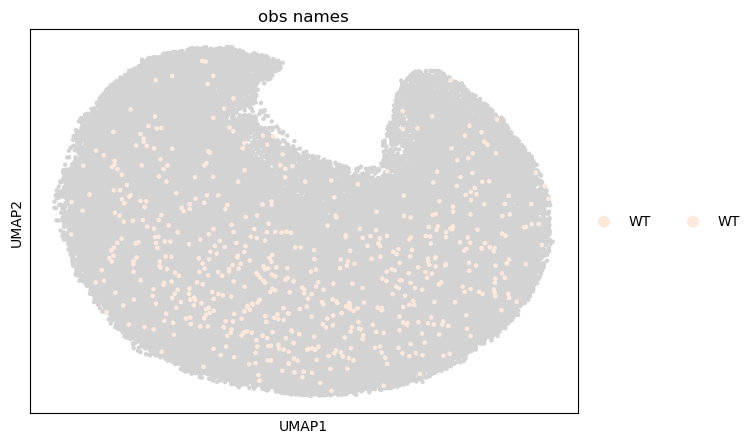

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


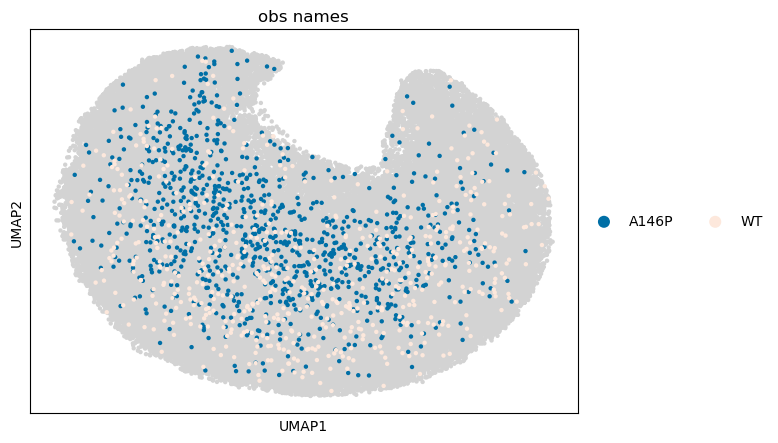

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


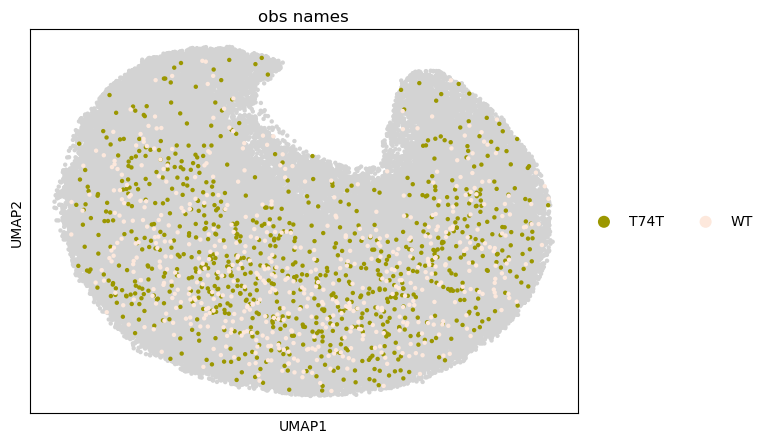

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


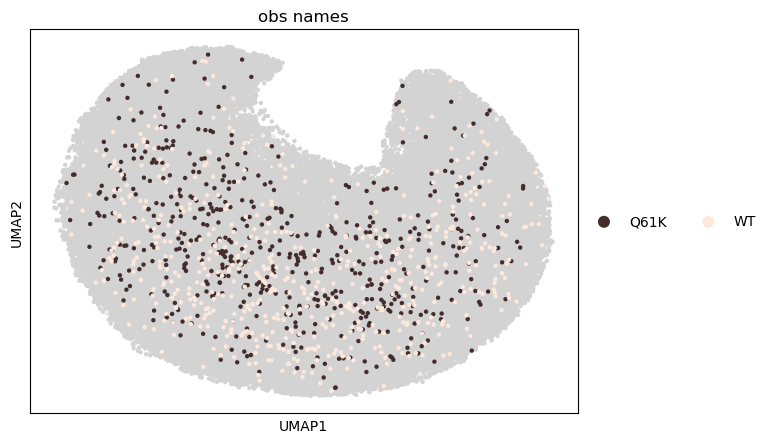

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


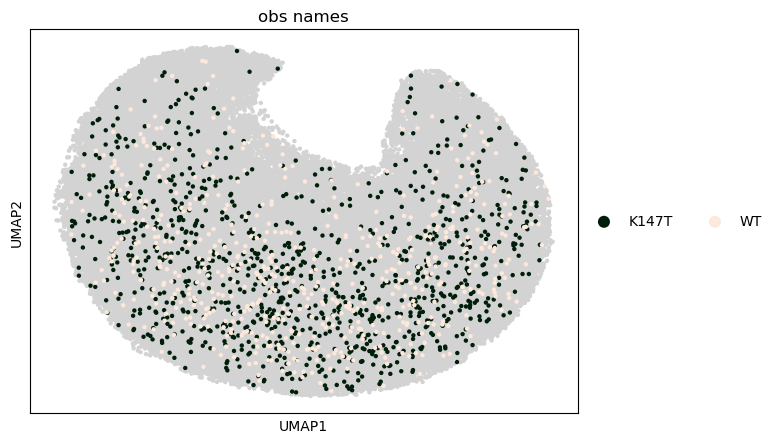

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


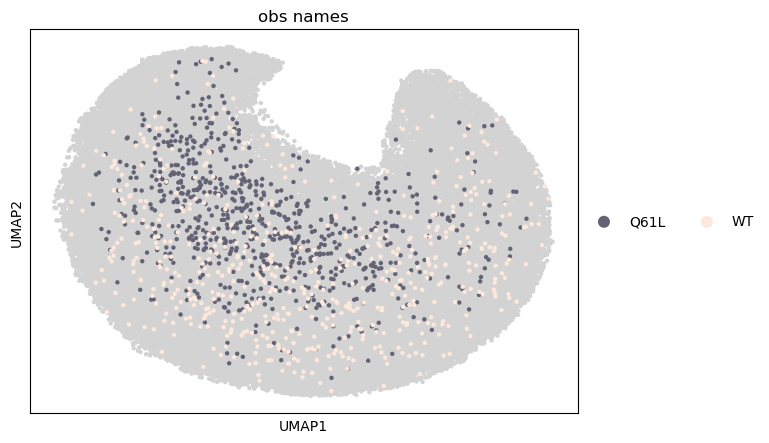

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


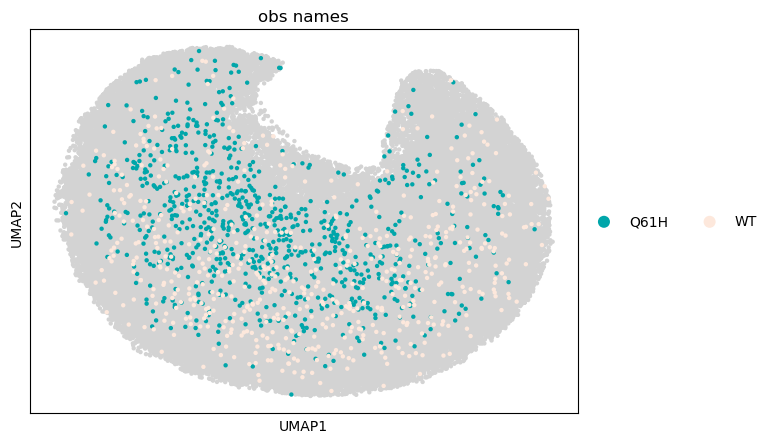

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


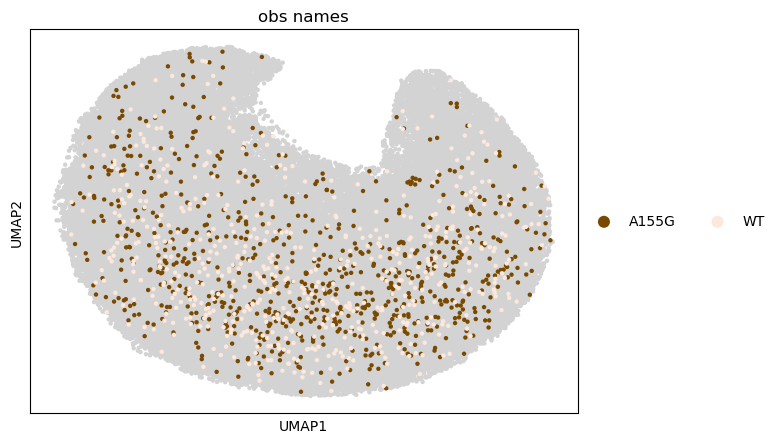

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


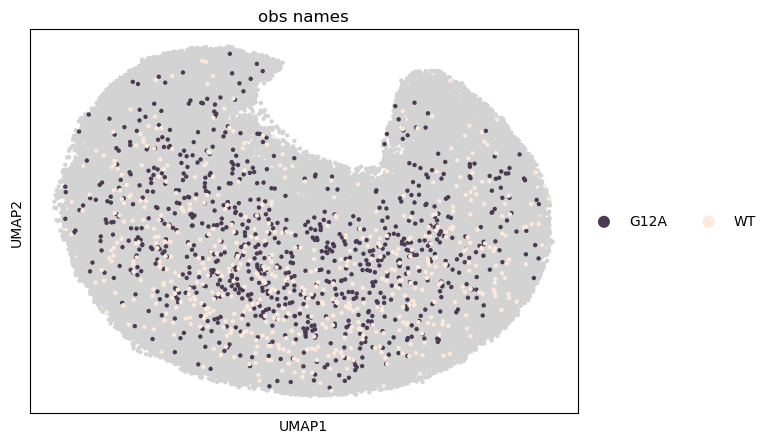

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


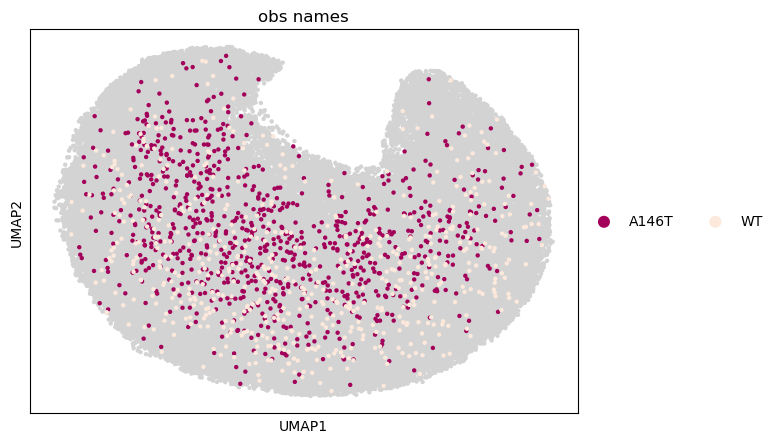

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


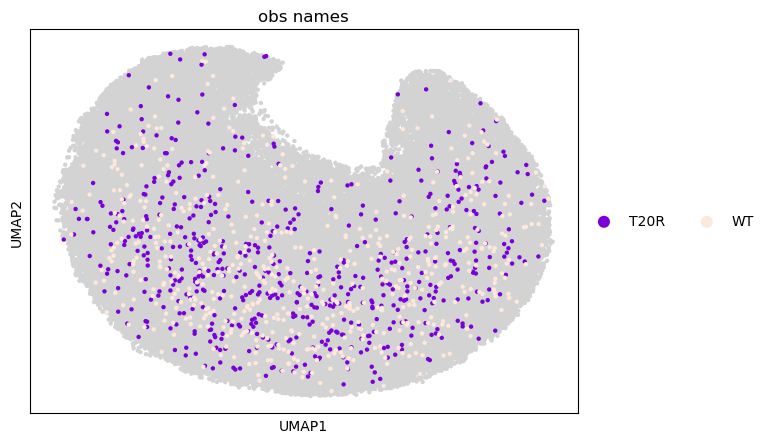

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


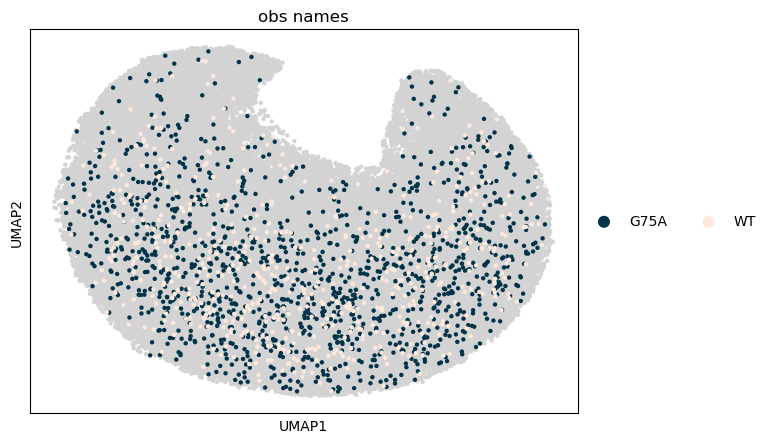

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


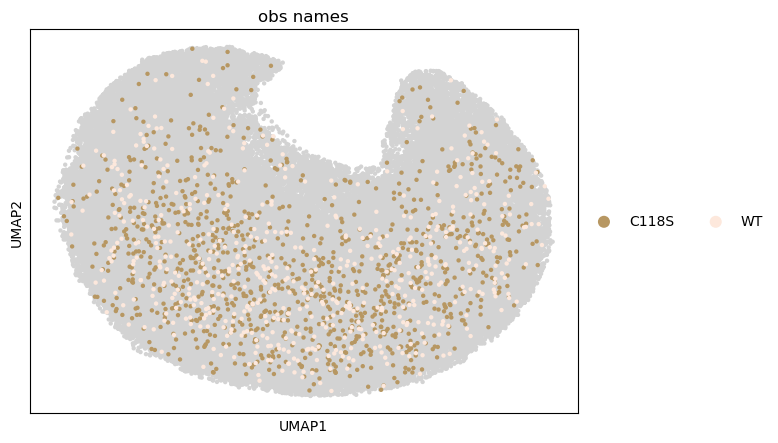

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


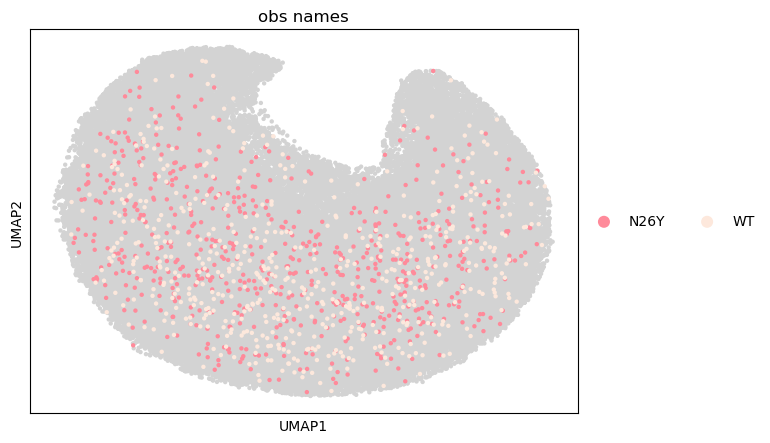

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


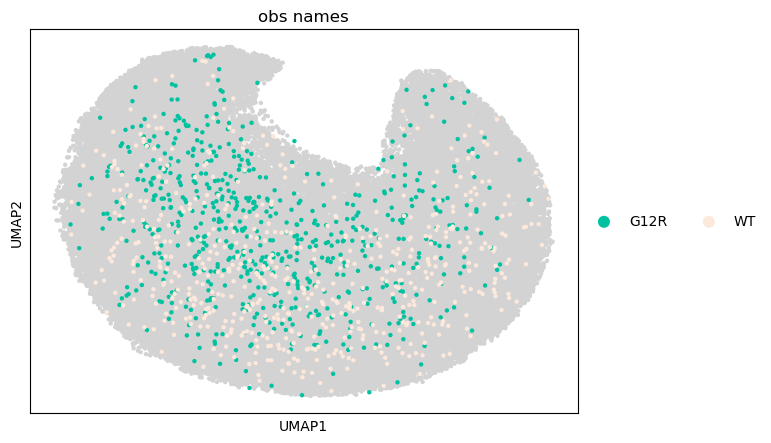

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


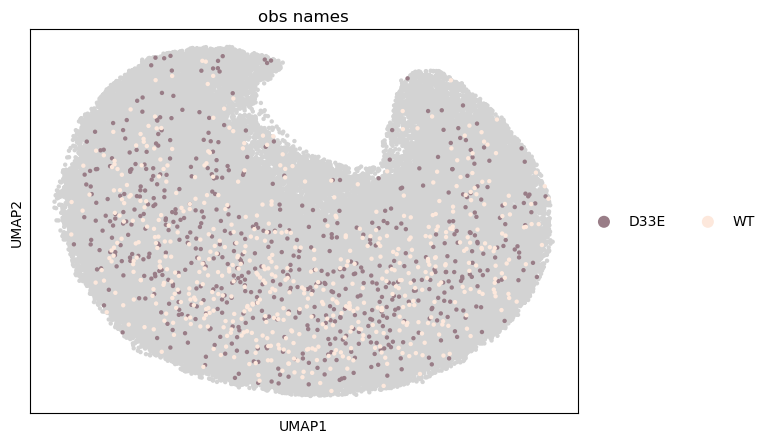

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


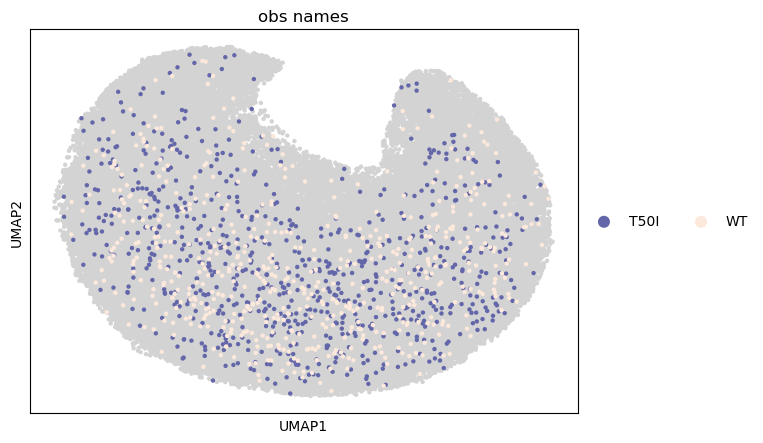

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


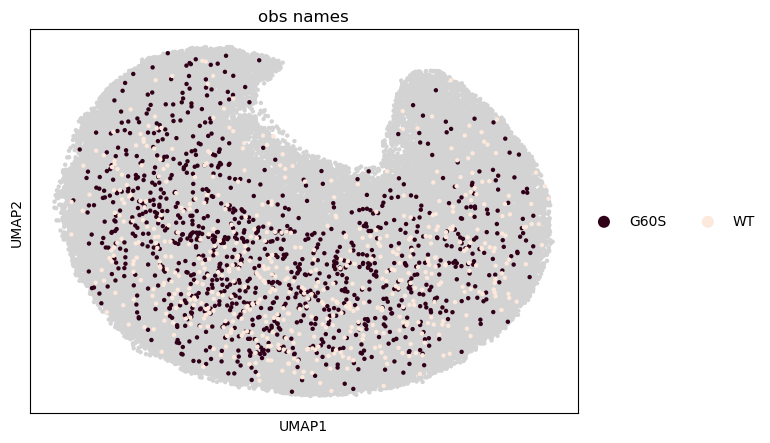

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


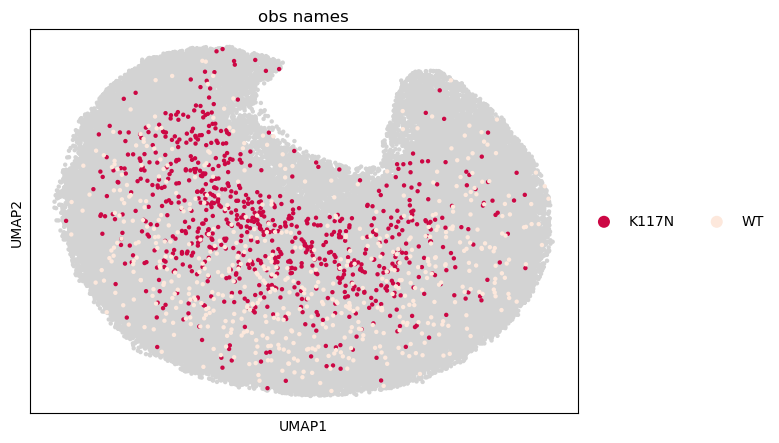

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


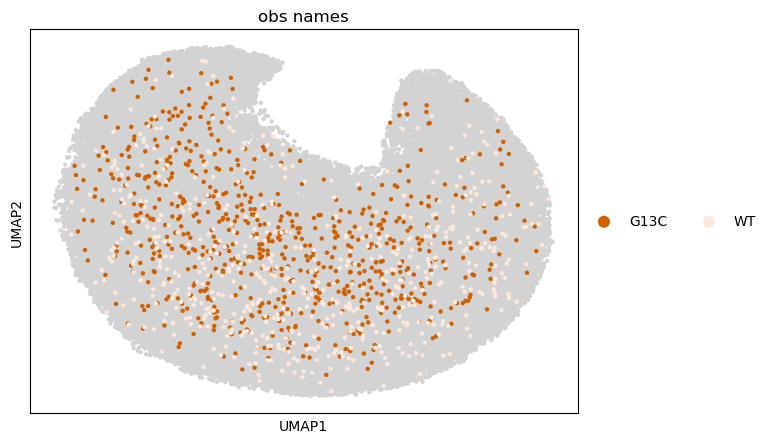

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


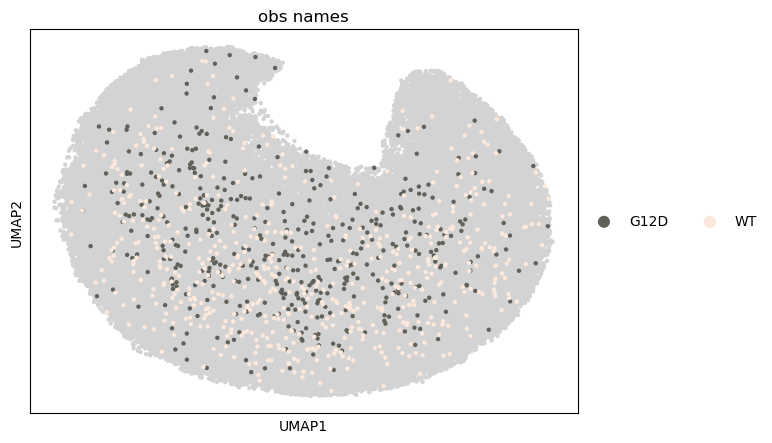

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


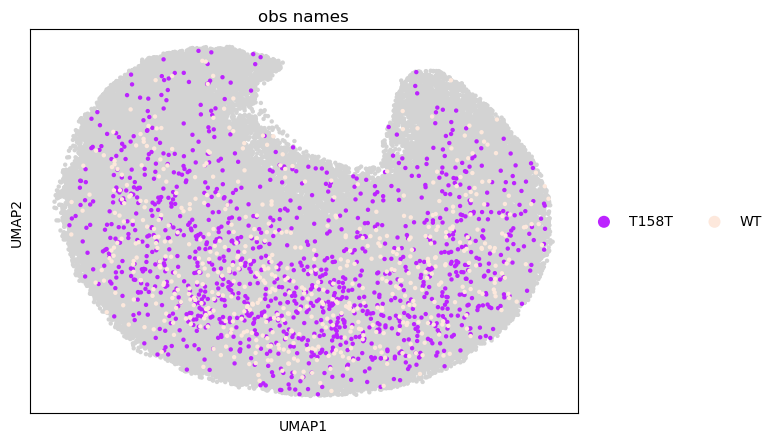

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


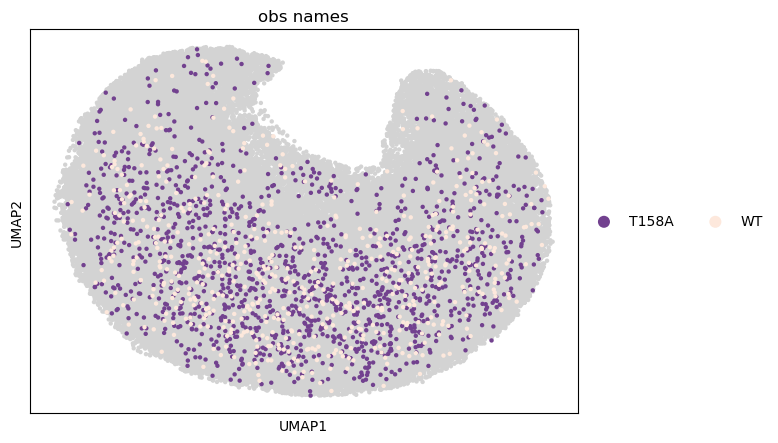

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


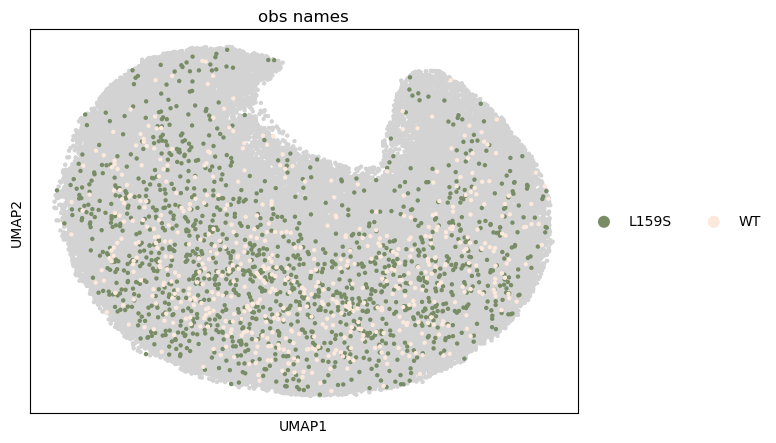

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


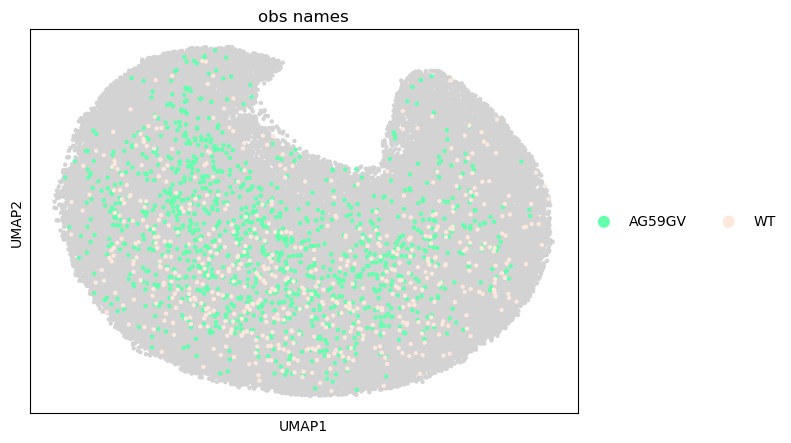

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


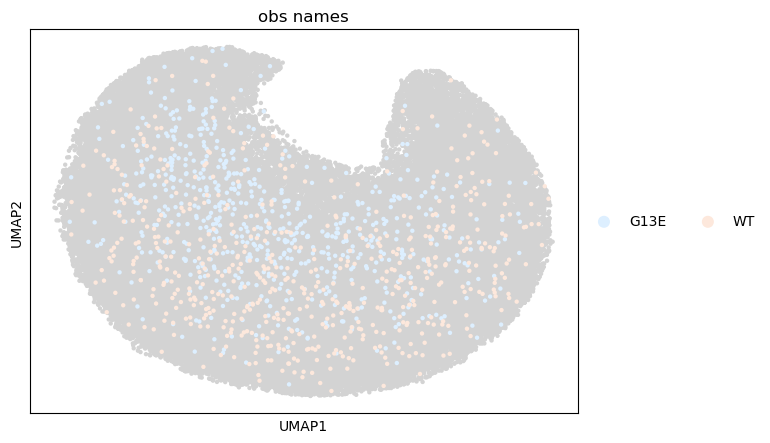

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


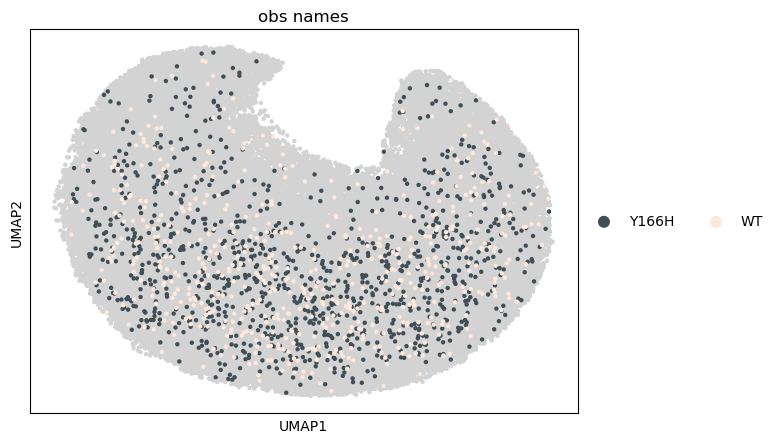

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


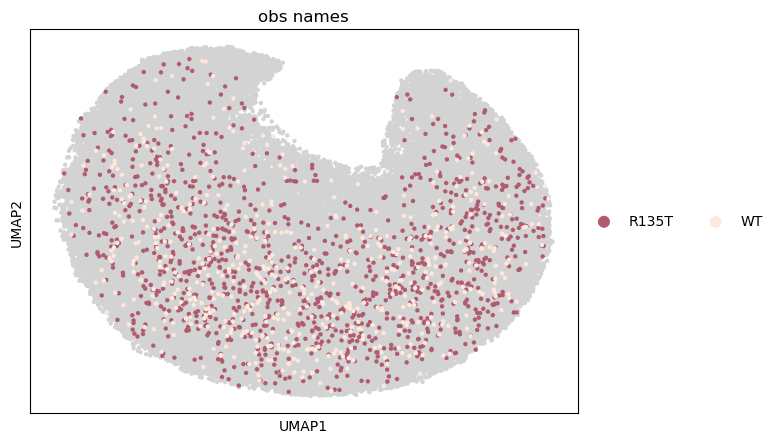

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


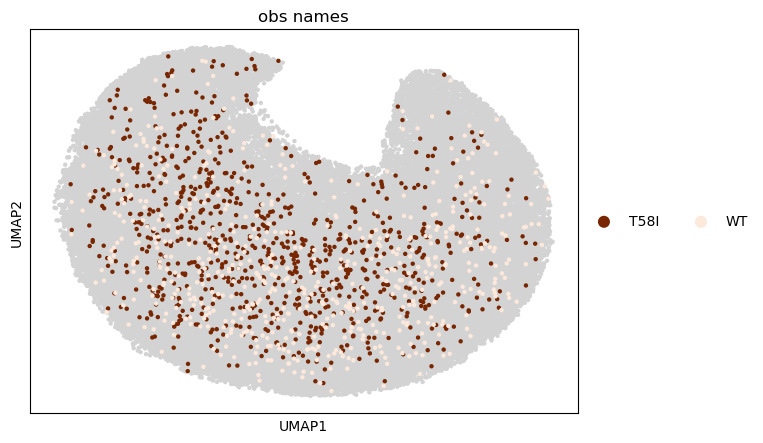

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


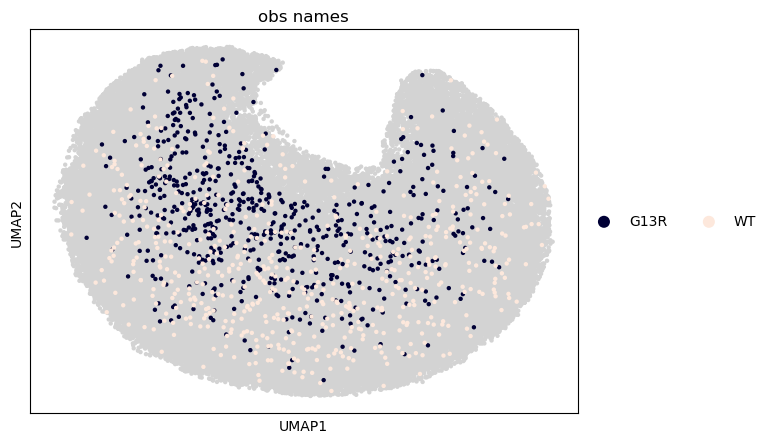

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


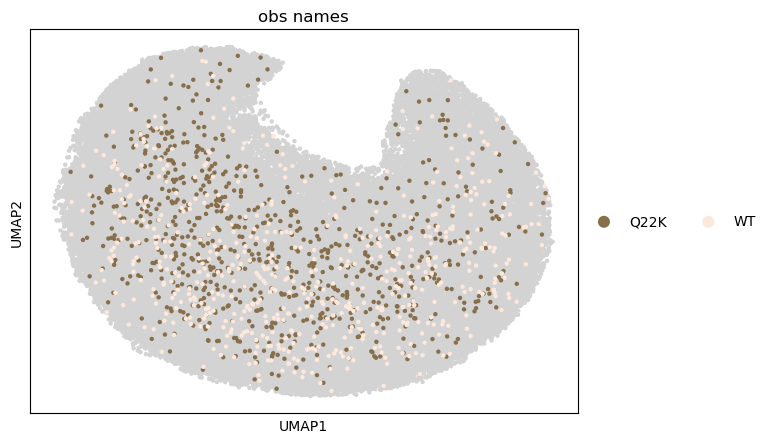

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


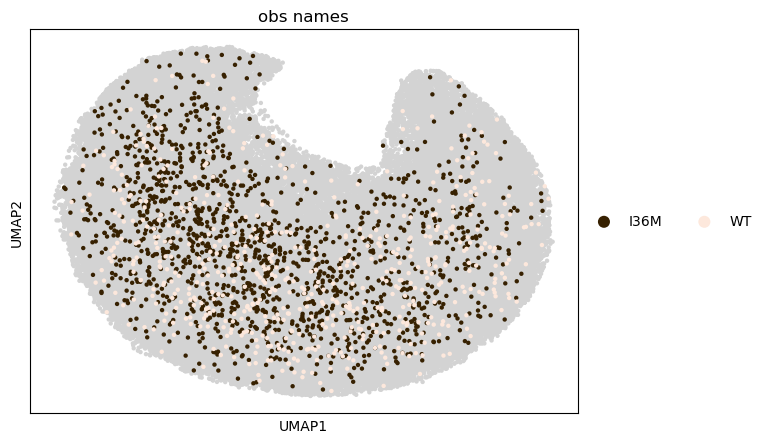

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


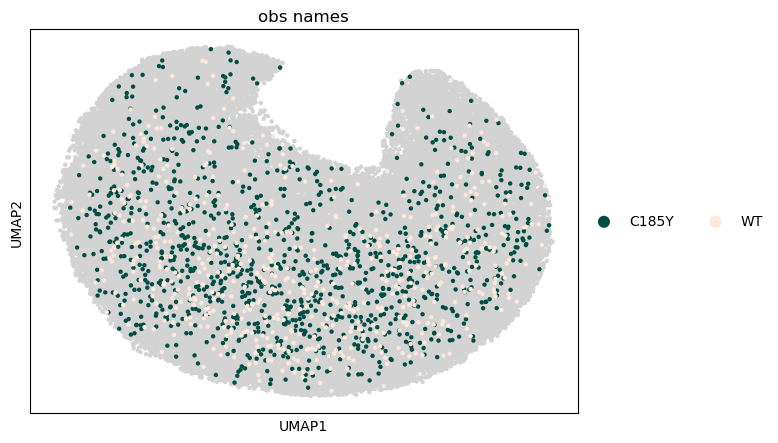

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


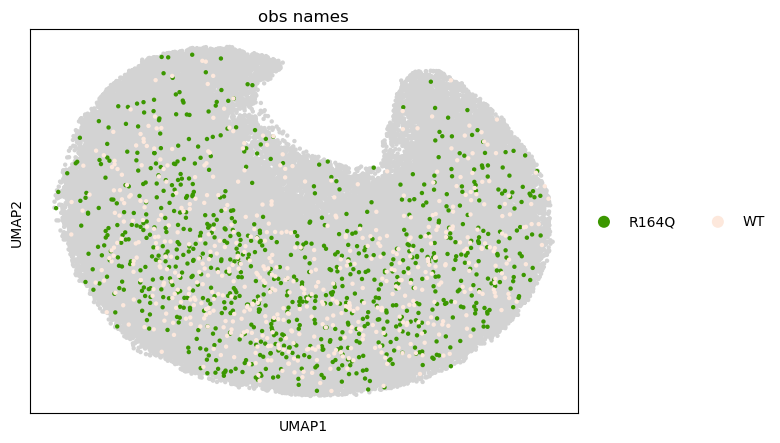

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


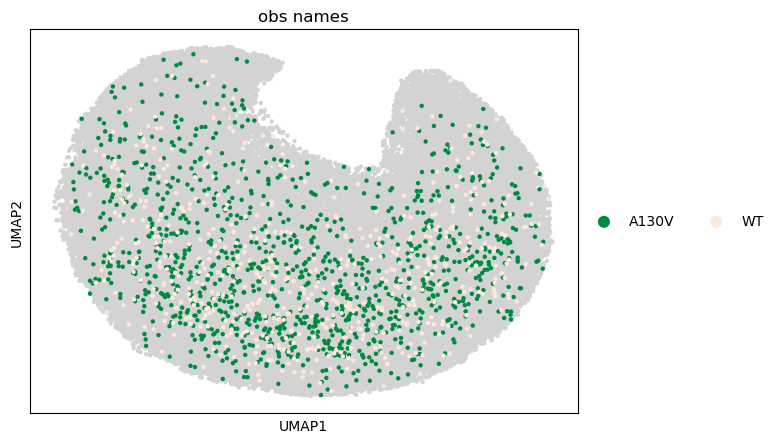

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


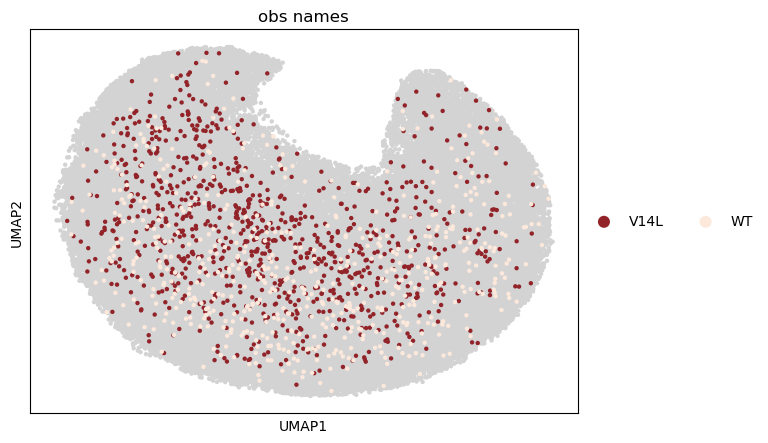

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


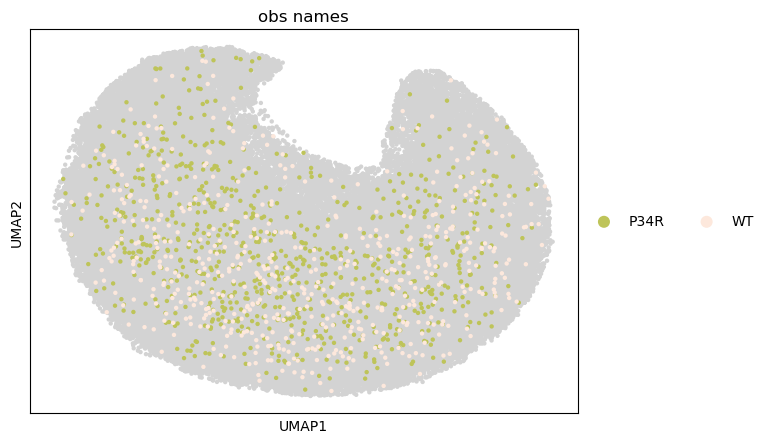

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


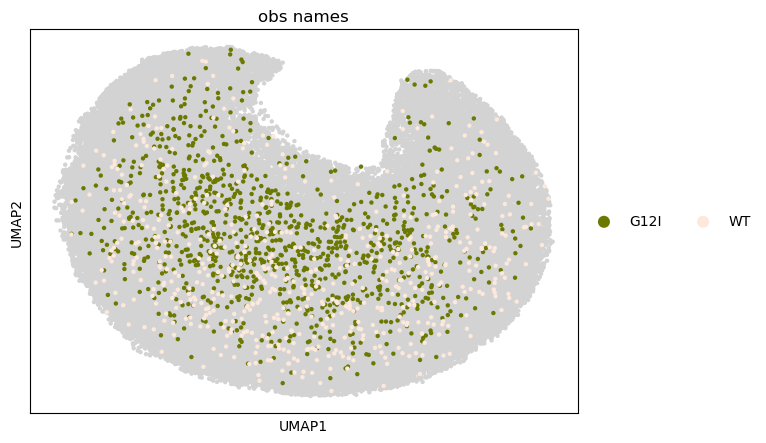

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


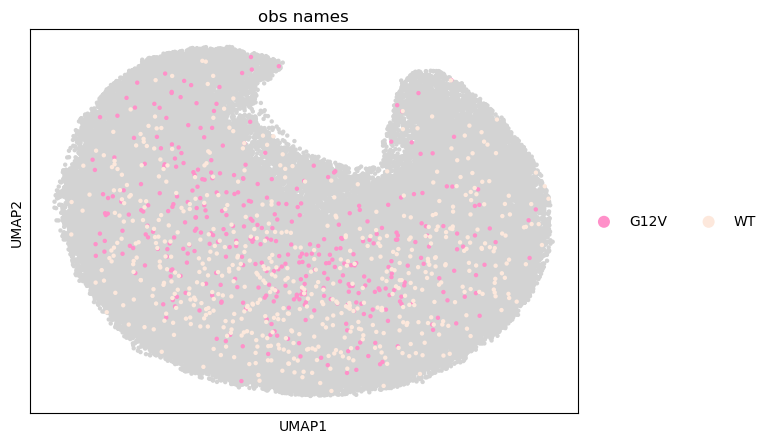

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


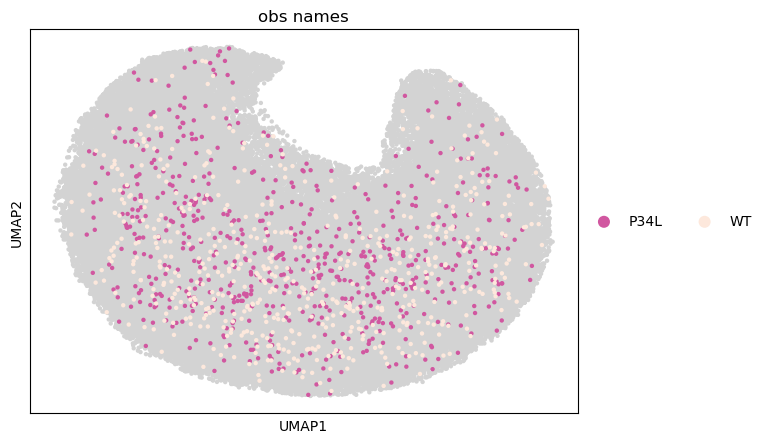

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


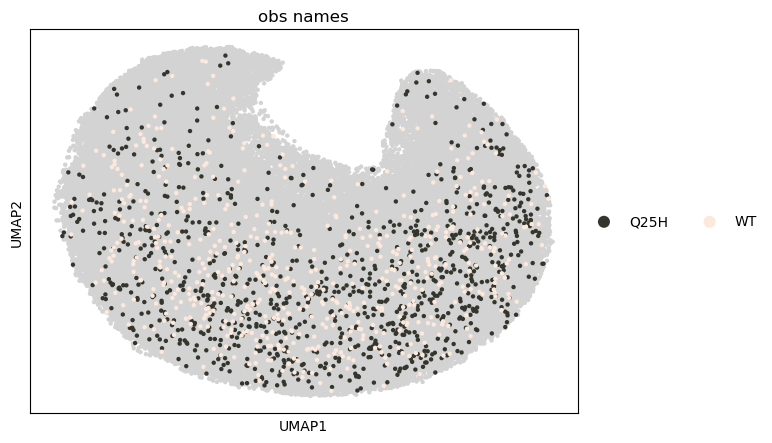

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


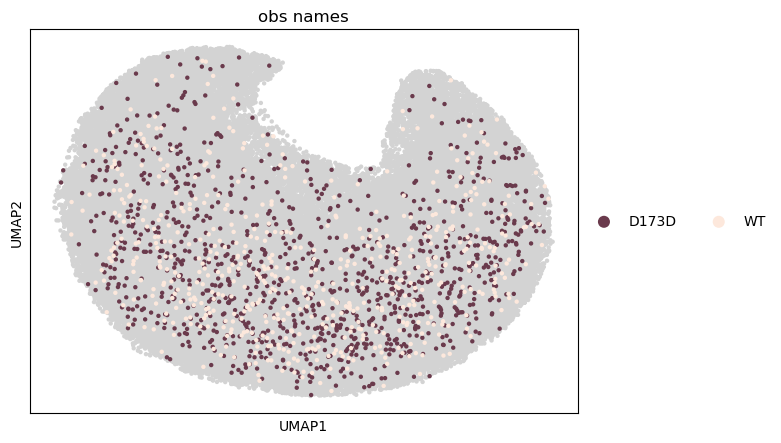

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


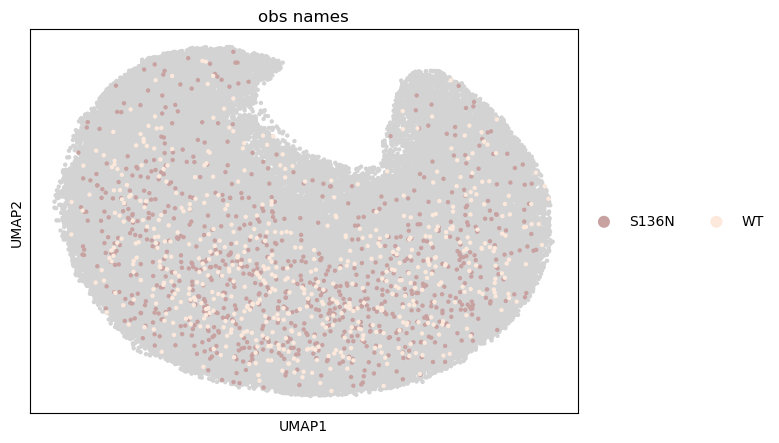

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


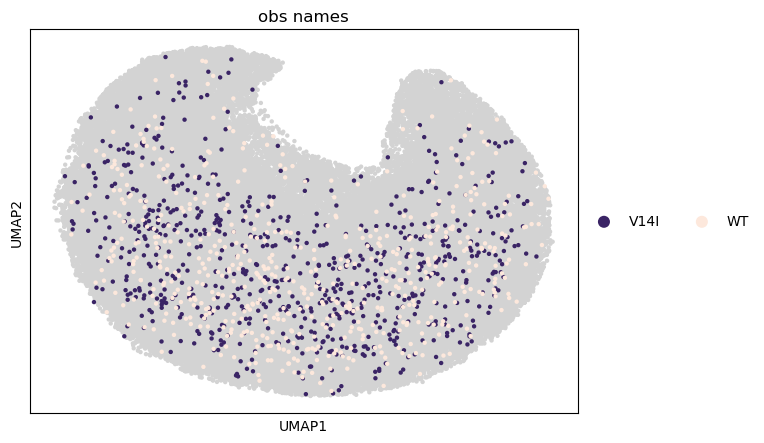

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


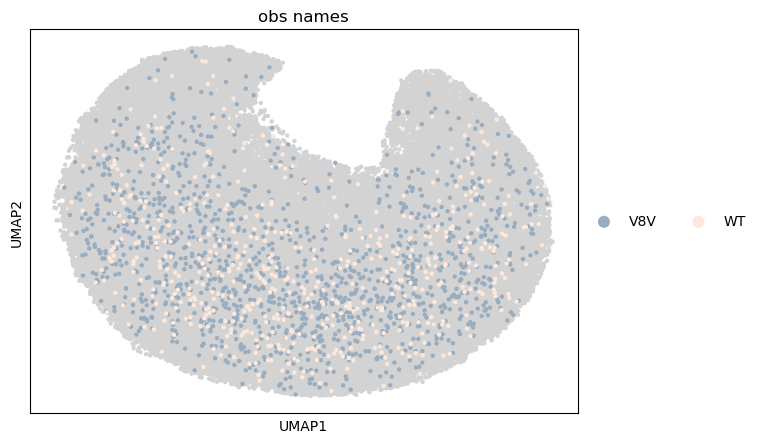

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


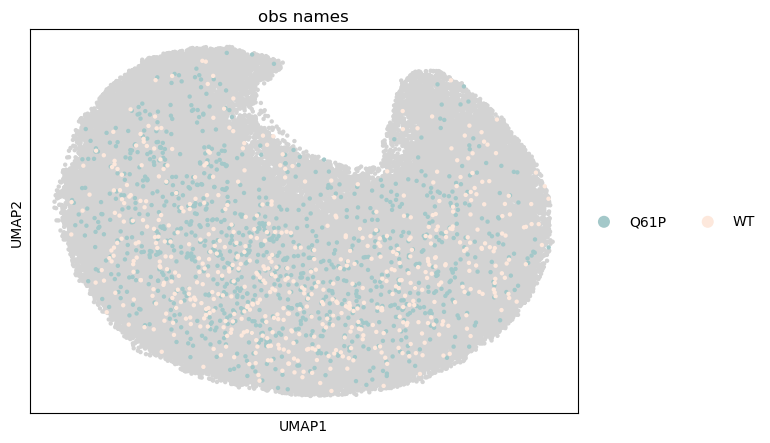

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


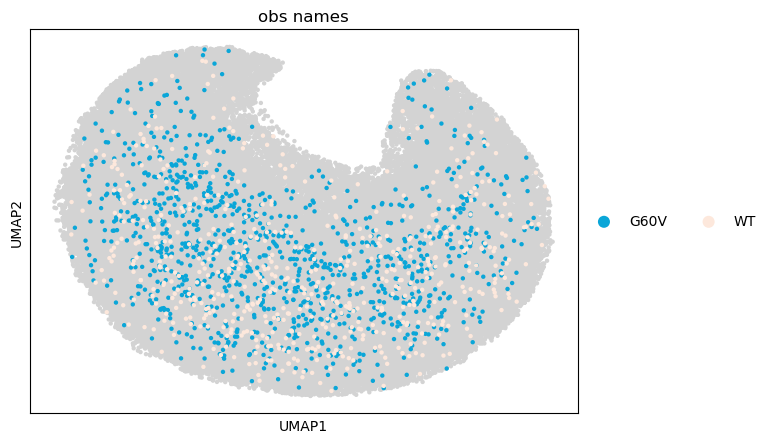

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


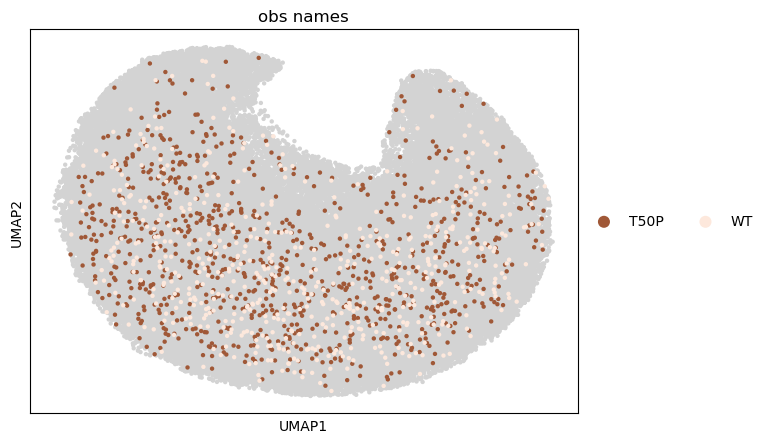

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


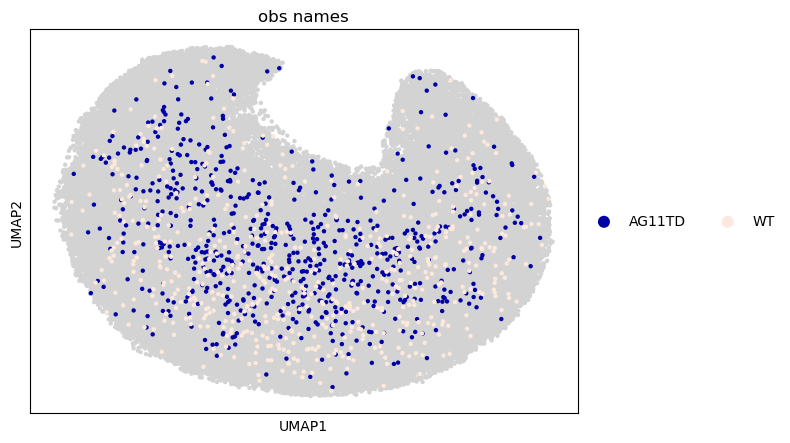

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


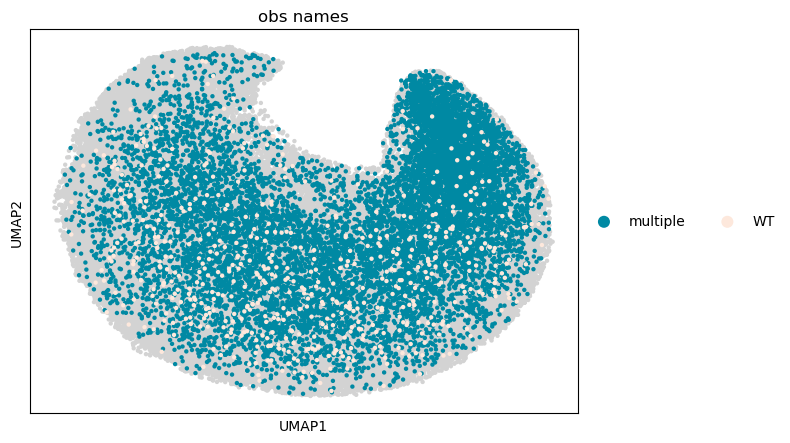

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


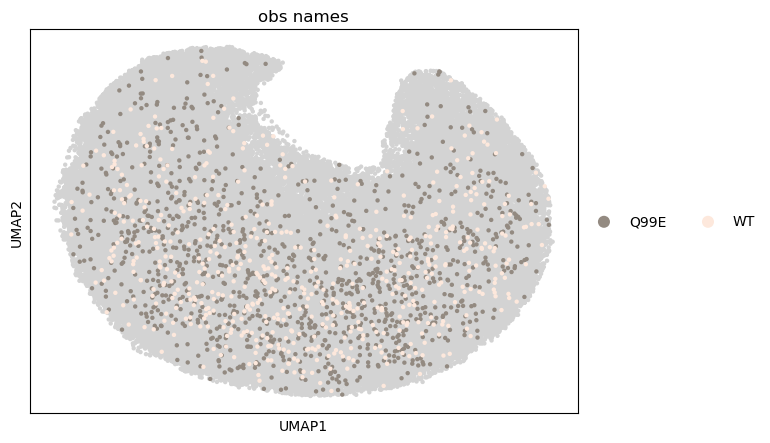

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


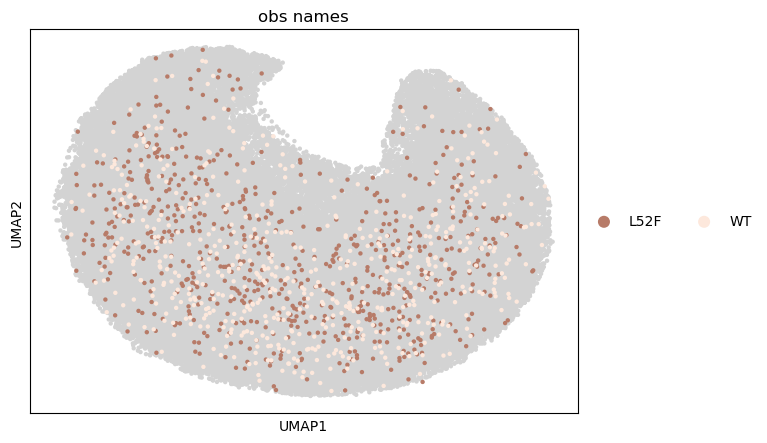

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


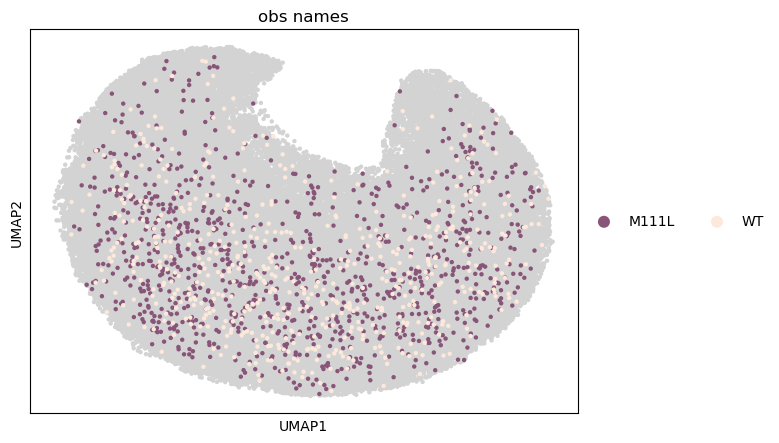

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


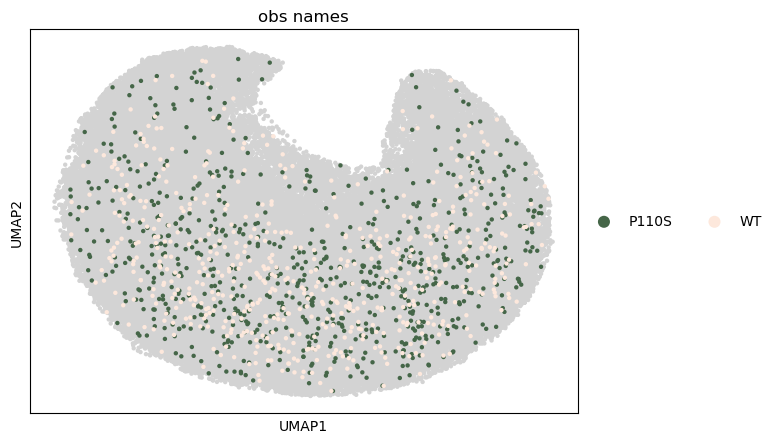

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


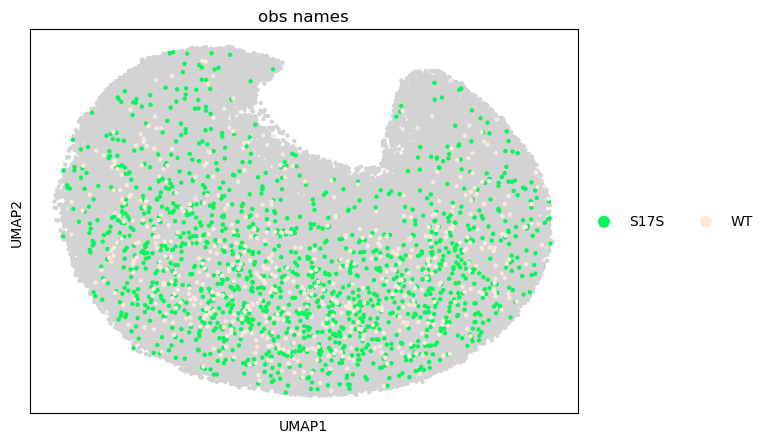

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


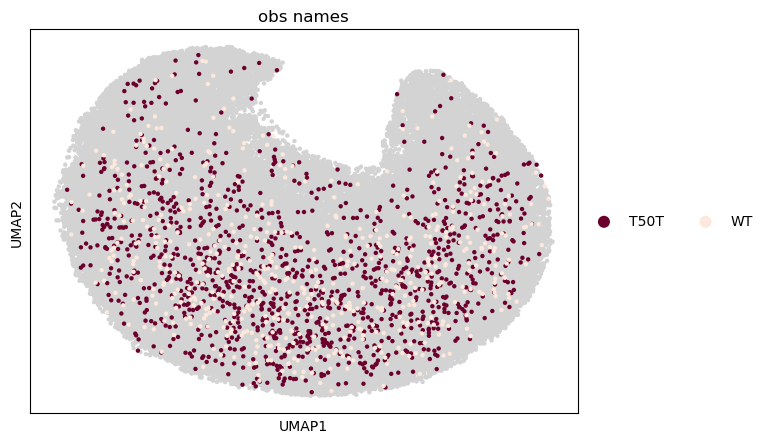

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


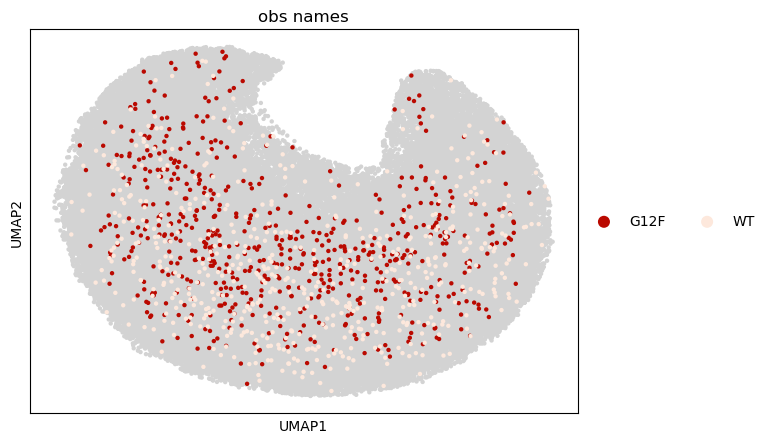

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


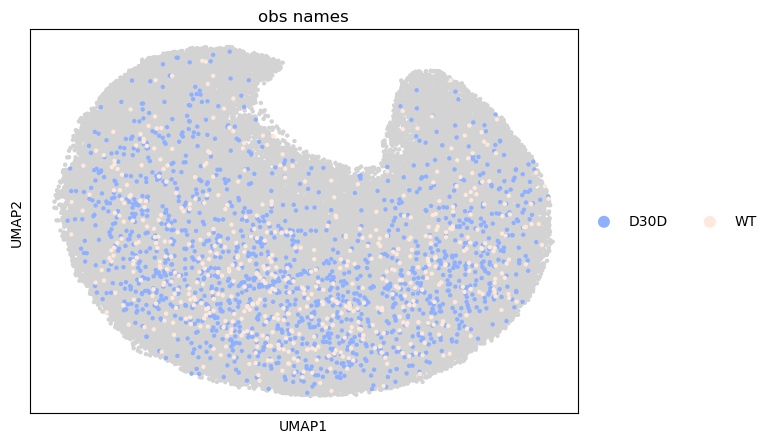

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


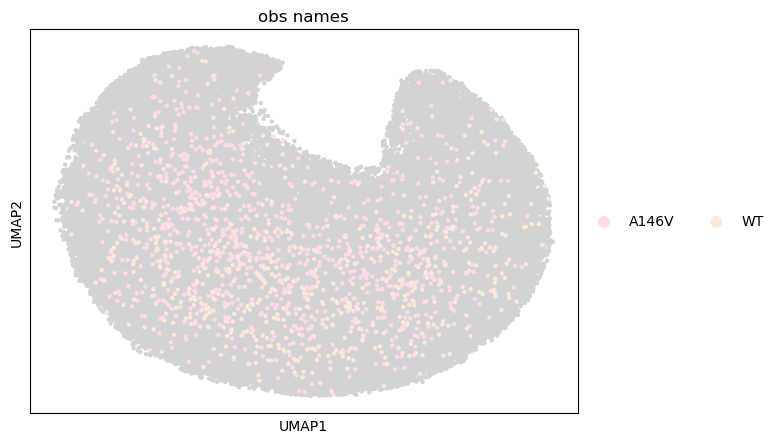

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


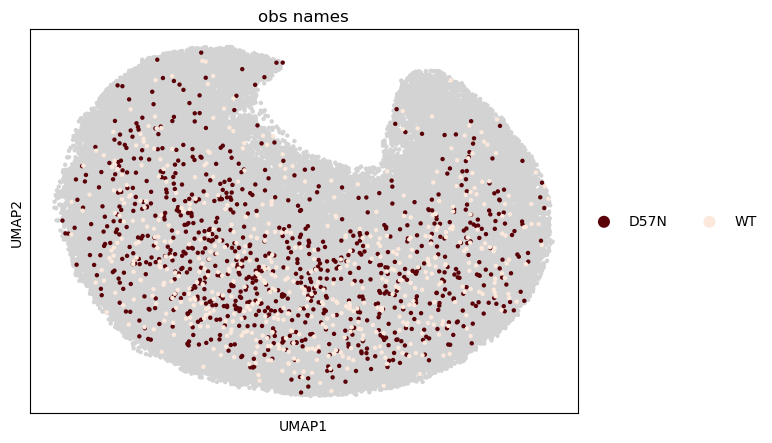

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


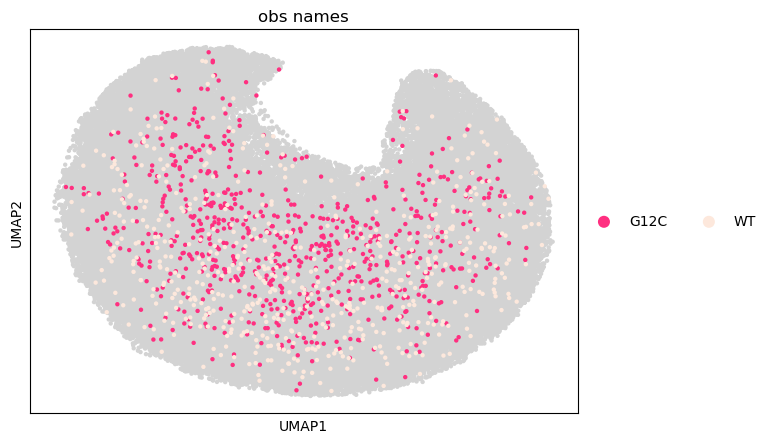

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


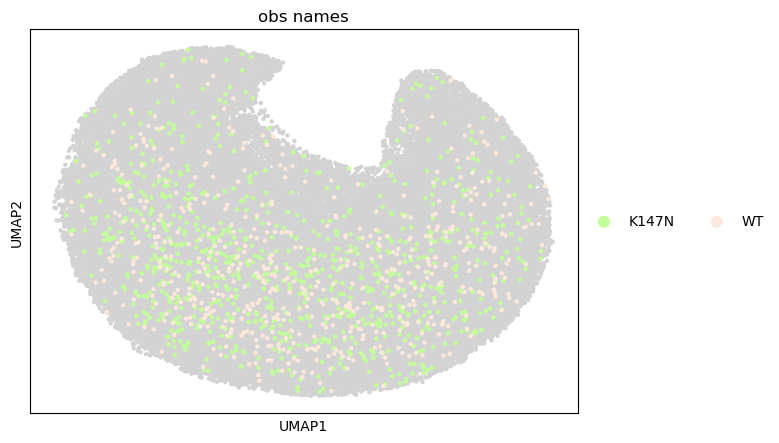

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


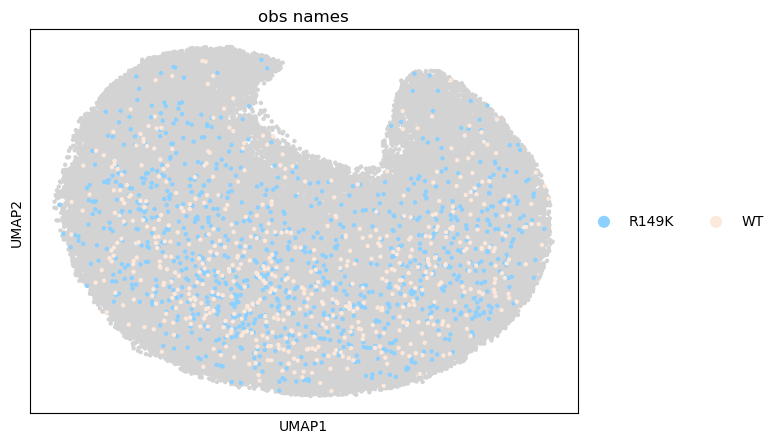

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


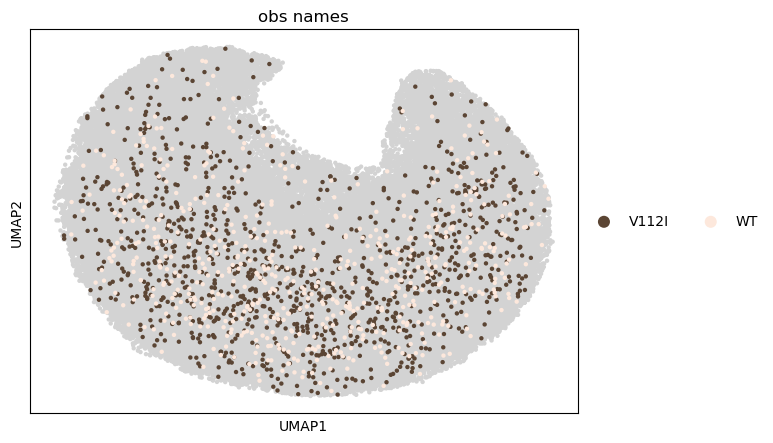

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


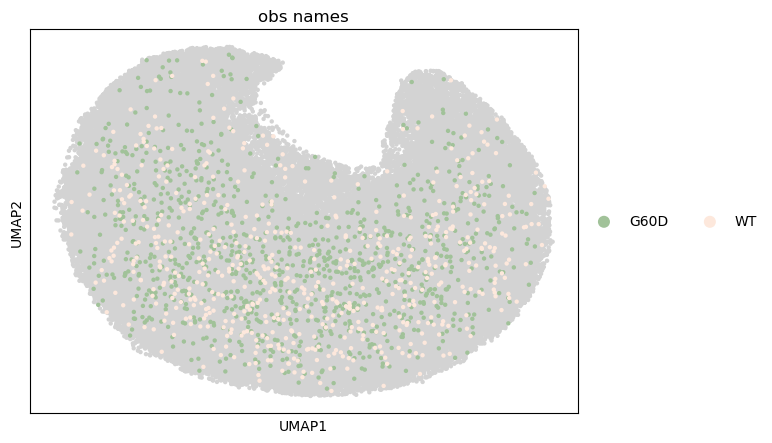

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


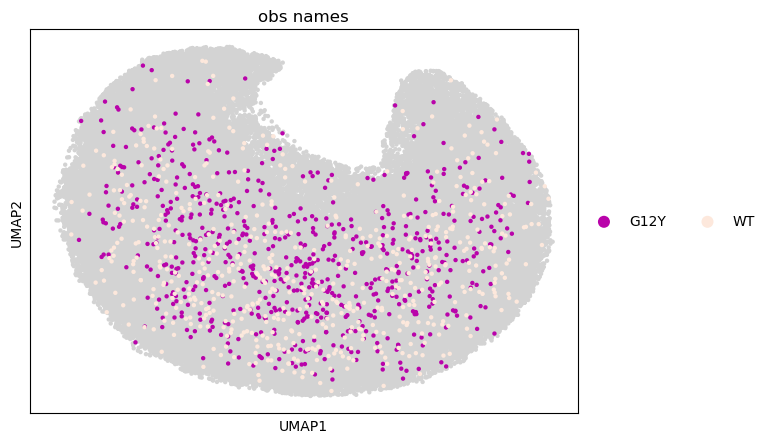

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


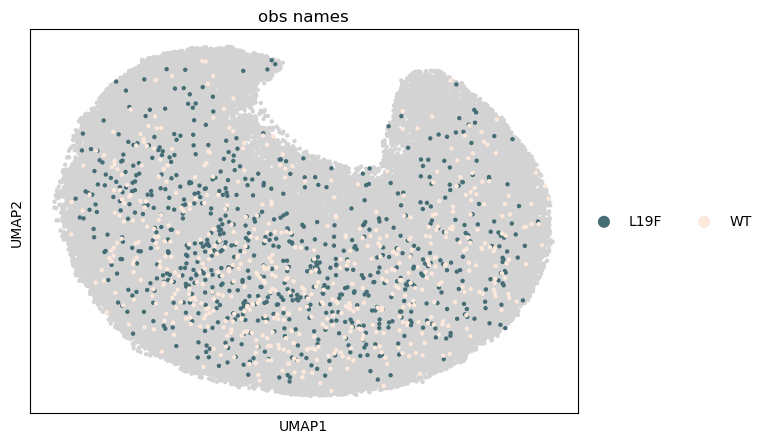

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


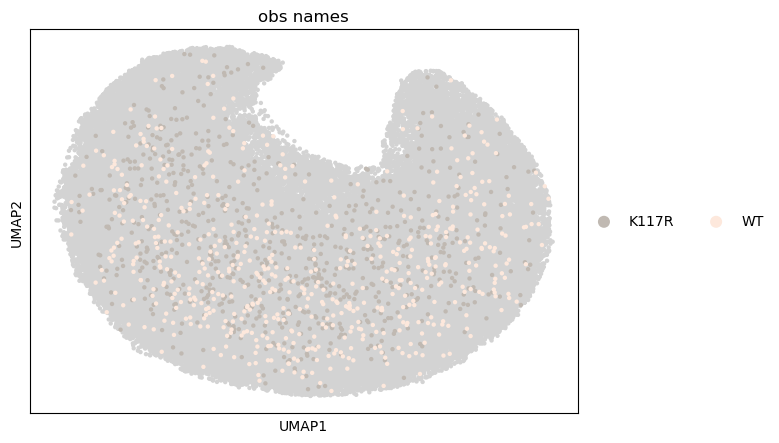

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


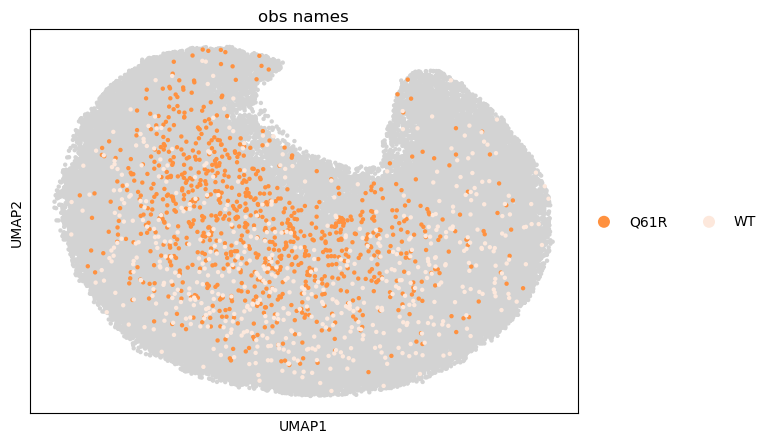

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


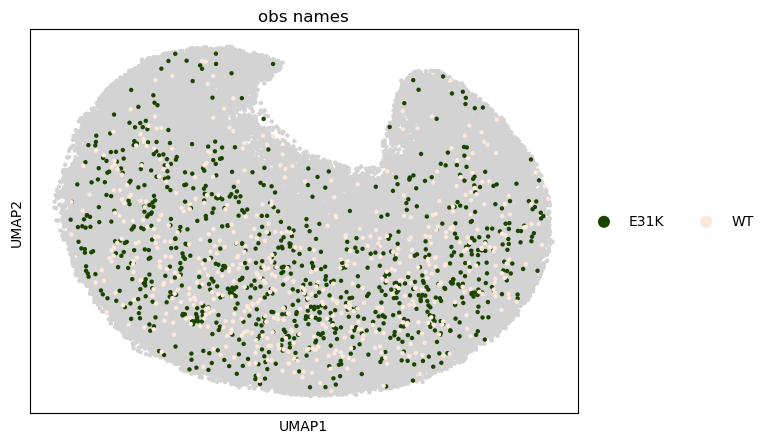

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


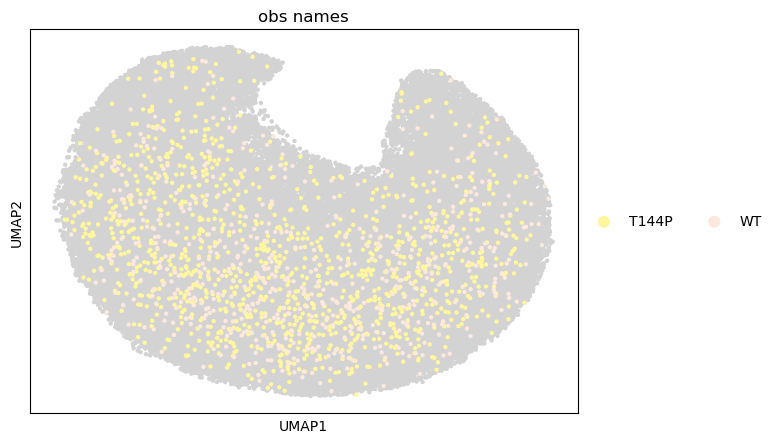

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


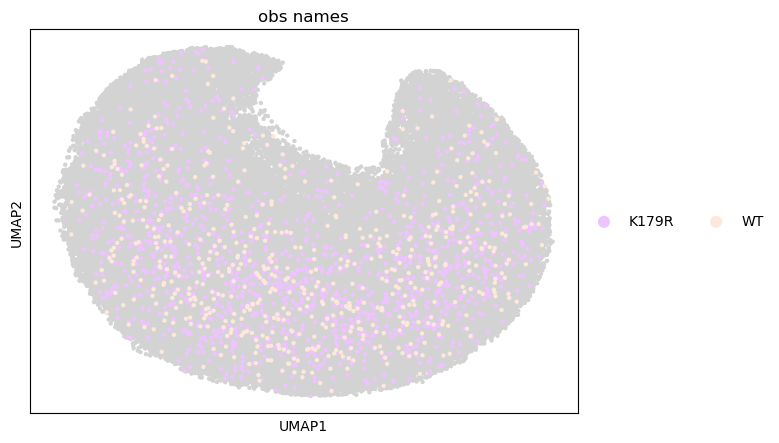

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


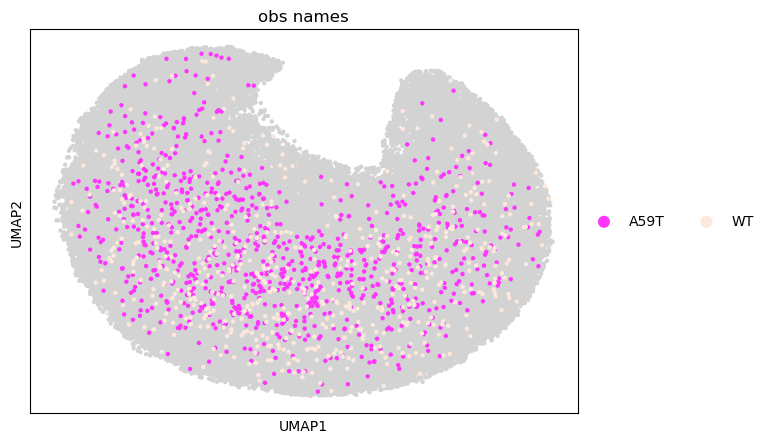

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


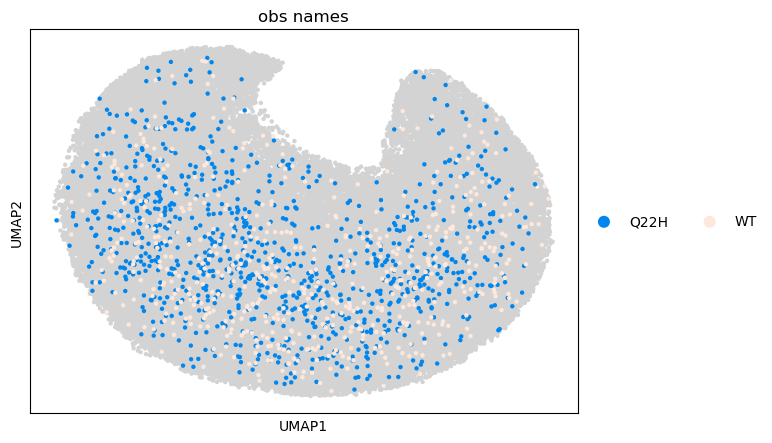

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


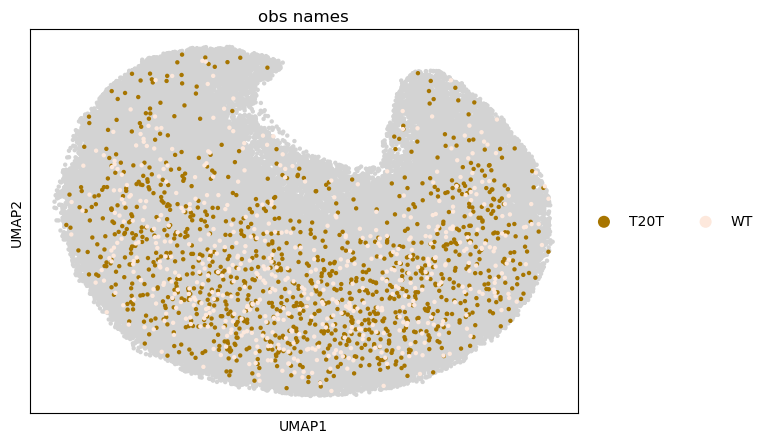

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


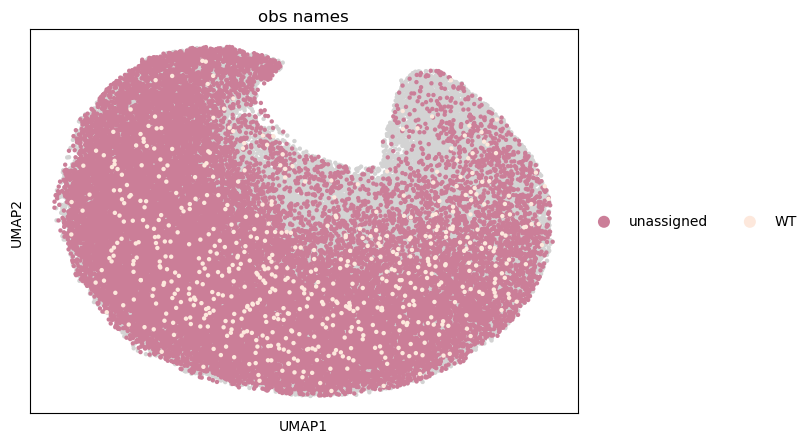

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


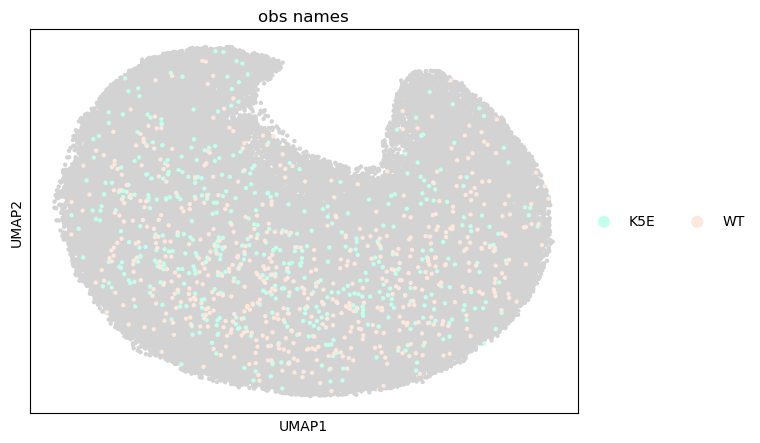

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


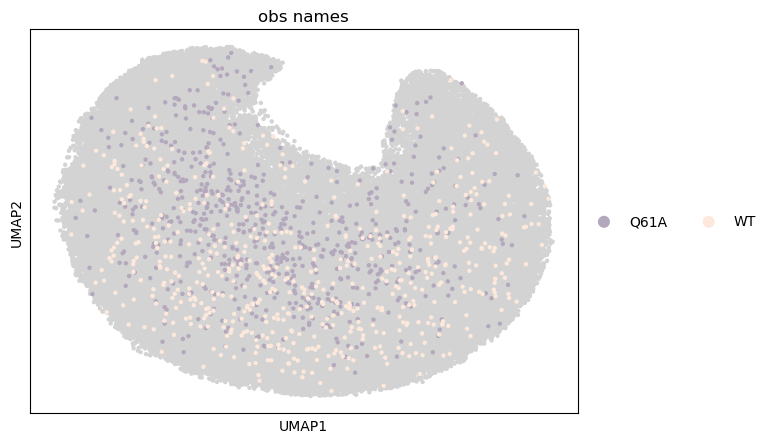

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


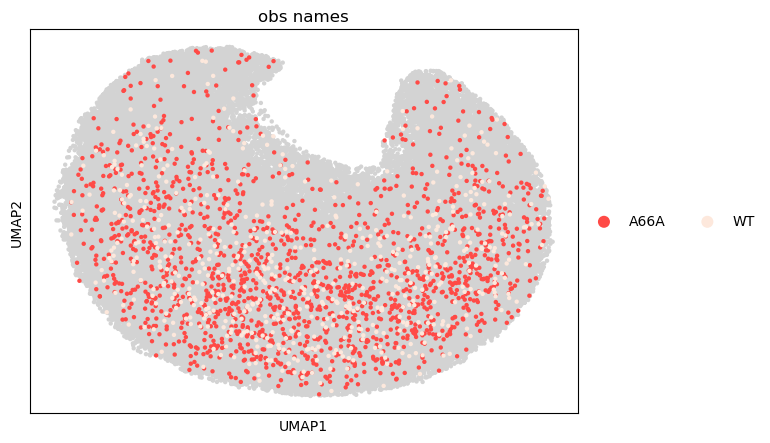

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


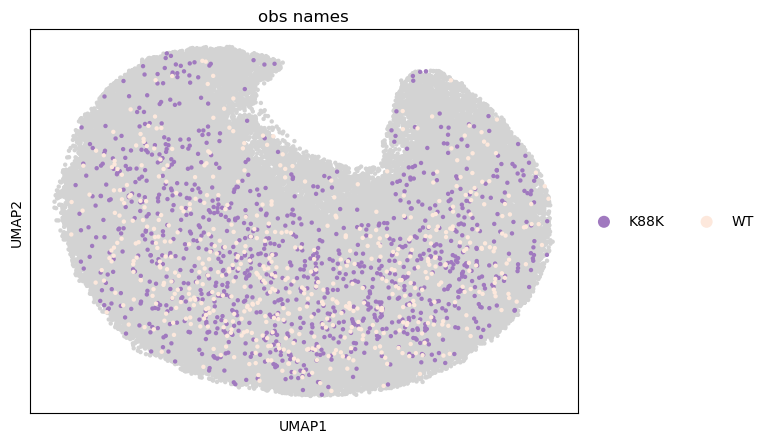

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


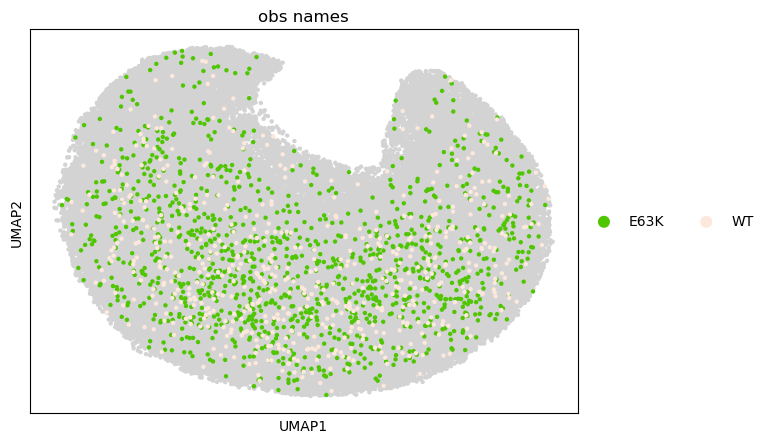

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


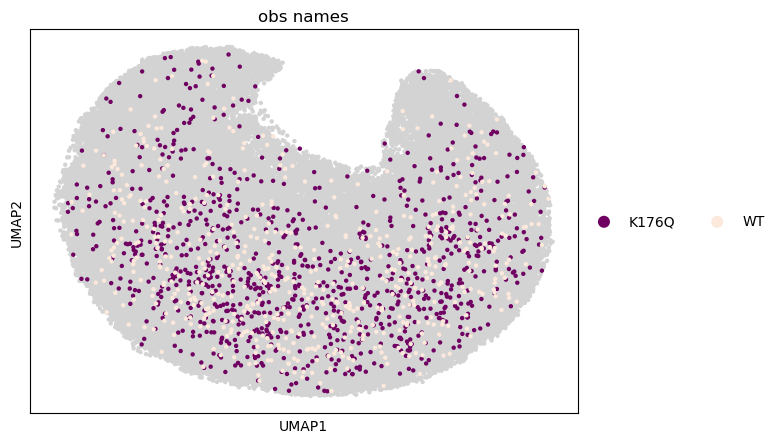

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


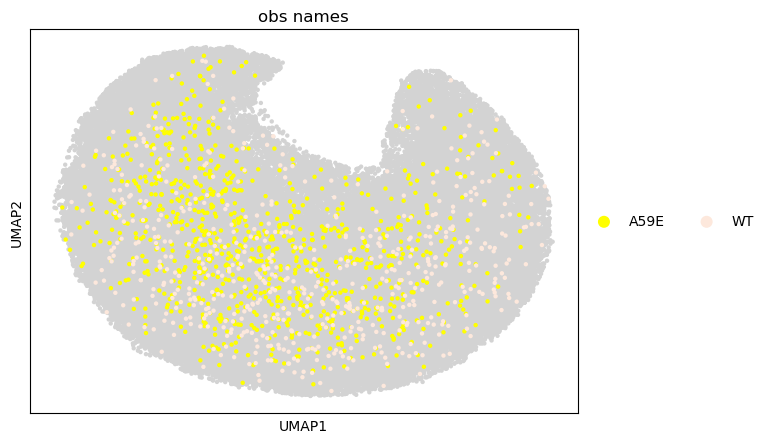

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


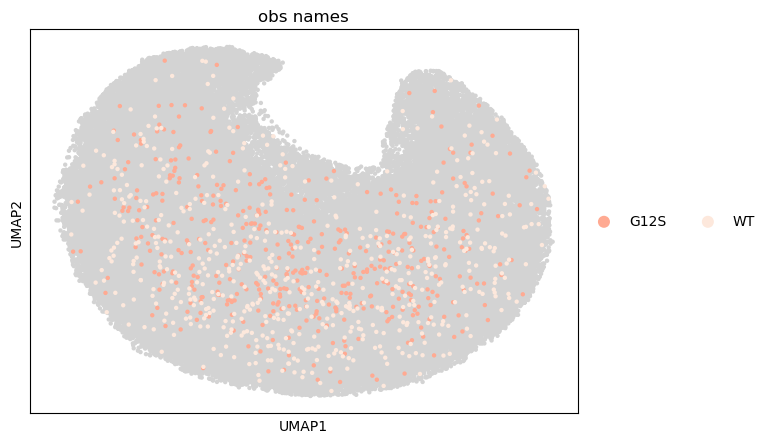

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:487: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


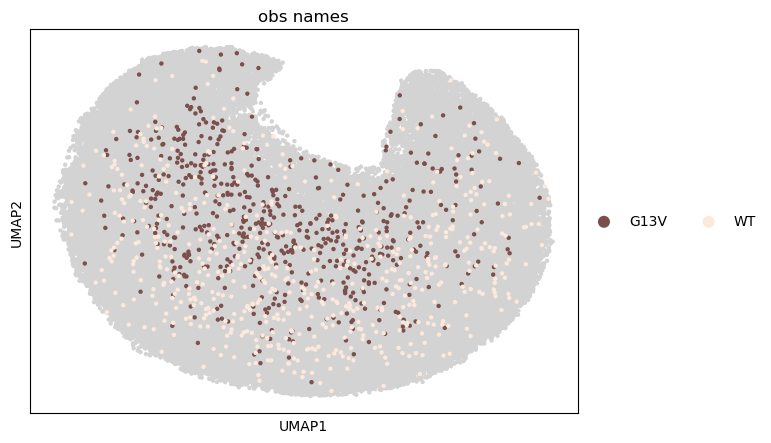

Execution time: 152.35 seconds


In [9]:
# Plot UMAP by variants
pseq.var_umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:38: DeprecationWarning: ast.Num is deprecated and will be removed in Python 3.14; use ast.Constant instead
  if isinstance(node, ast.Num):  # <number>
/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/joblib/_utils.py:39: DeprecationWarning: Attribute n is deprecated and will be removed in Python 3.14; use value instead
  return node.n


/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


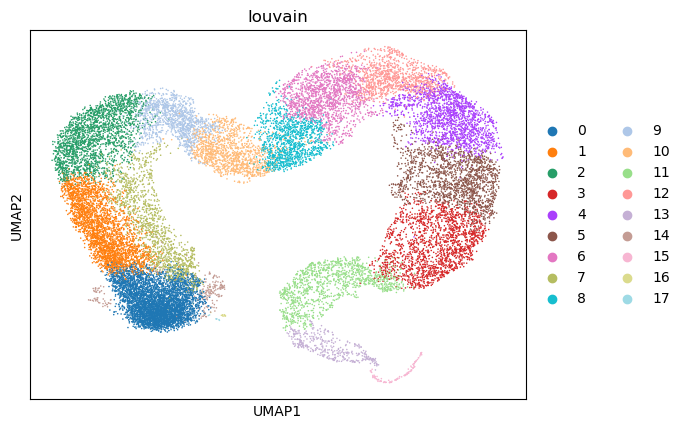

Execution time: 194.151 seconds


In [10]:
# Louvain clustering of genes expressions
adata = pseq.louvain_genes(adata)

In [3]:
##### CHECKPOINT: Recover outpout from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/louvain_data.pkl', 'rb') as file:
    adata = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/louvain_data.pkl', 'rb') as file:\n    adata = pkl.load(file)\n"

In [13]:
# Saving the genes names (HGNC nomenclature)
with open('var_names.txt', 'w') as file:
    for gene in adata.var['var_names']:
        file.write(gene + '\n')

In [14]:
##### HGNC nomenclature ---> BioMart mapping ---> Ensembl genes ID nomenclature #####

In [15]:
# Fetching the Ensembl genes IDs and checking lost genes during mapping
var_names = pd.read_csv('mart_export.txt', sep = '\t')
display(var_names)
var_dict = var_names.set_index('Gene name').T.to_dict('records')[0]  # Duplicated mappings are removed
print('The %.2f%% of genes were lost during mapping' % (100 - len(var_dict) / len(adata.var['var_names']) * 100))

,Gene stable ID,Gene name
0,ENSG00000198888,MT-ND1
1,ENSG00000198763,MT-ND2
2,ENSG00000198804,MT-CO1
3,ENSG00000198712,MT-CO2
4,ENSG00000228253,MT-ATP8
...,...,...
19249,ENSG00000158022,TRIM63
19250,ENSG00000175087,PDIK1L
19251,ENSG00000197245,FAM110D
19252,ENSG00000142684,ZNF593


/tmp/ipykernel_4583/3874717756.py:4: UserWarning: DataFrame columns are not unique, some columns will be omitted.
  var_dict = var_names.set_index('Gene name').T.to_dict('records')[0]  # Duplicated mappings are removed


The 29.16% of genes were lost during mapping


In [16]:
# Genes not mapped will be linked to the ID 'Null'
mart = []
for var in adata.var['var_names']:
    if var in var_dict.keys(): mart.append(var_dict[var])
    else:                      mart.append('Null')

In [18]:
# Pathway enrichment analysis with gprofiler library
gprofiler_df = pseq.path_gprofiler(adata, mart)

,louvain,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents,intersections,evidences
0,0,KEGG,KEGG:04080,Neuroactive ligand-receptor interaction,4.914747e-21,True,Neuroactive ligand-receptor interaction,365,685,90,8484,0.131387,0.246575,query_1,[KEGG:00000],"[ENSG00000158748, ENSG00000121764, ENSG0000017...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
1,0,KEGG,KEGG:04974,Protein digestion and absorption,3.095260e-06,True,Protein digestion and absorption,103,685,27,8484,0.039416,0.262136,query_1,[KEGG:00000],"[ENSG00000142615, ENSG00000215704, ENSG0000017...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
2,0,KEGG,KEGG:04060,Cytokine-cytokine receptor interaction,3.634039e-06,True,Cytokine-cytokine receptor interaction,291,685,52,8484,0.075912,0.178694,query_1,[KEGG:00000],"[ENSG00000186891, ENSG00000119535, ENSG0000011...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
3,0,KEGG,KEGG:04742,Taste transduction,1.797795e-05,True,Taste transduction,85,685,23,8484,0.033577,0.270588,query_1,[KEGG:00000],"[ENSG00000173662, ENSG00000136531, ENSG0000017...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
4,0,KEGG,KEGG:05321,Inflammatory bowel disease,6.296335e-04,True,Inflammatory bowel disease,62,685,17,8484,0.024818,0.274194,query_1,[KEGG:00000],"[ENSG00000162594, ENSG00000081985, ENSG0000014...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,15,KEGG,KEGG:03010,Ribosome,3.678348e-115,True,Ribosome,153,89,72,8484,0.808989,0.470588,query_1,[KEGG:00000],"[ENSG00000142676, ENSG00000142937, ENSG0000012...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
1,15,KEGG,KEGG:05171,Coronavirus disease - COVID-19,5.520411e-99,True,Coronavirus disease - COVID-19,231,89,72,8484,0.808989,0.311688,query_1,[KEGG:00000],"[ENSG00000142676, ENSG00000142937, ENSG0000012...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
2,15,KEGG,KEGG:00190,Oxidative phosphorylation,6.679991e-03,True,Oxidative phosphorylation,134,89,8,8484,0.089888,0.059701,query_1,[KEGG:00000],"[ENSG00000198888, ENSG00000198763, ENSG0000019...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."
3,15,KEGG,KEGG:05012,Parkinson disease,8.331121e-03,True,Parkinson disease,265,89,11,8484,0.123596,0.041509,query_1,[KEGG:00000],"[ENSG00000143947, ENSG00000136810, ENSG0000012...","[[KEGG], [KEGG], [KEGG], [KEGG], [KEGG], [KEGG..."


Execution time: 12.746 seconds


In [19]:
##### HGNC nomenclature ---> NCBI PubChem tool mapping ---> Entrez ID nomenclature #####

In [3]:
# Fetching the Entrez IDs assigned to each column
with open('entrez.txt', 'r') as file:
    entrez = [line.strip() for line in file.readlines()]
print('The %.2f%% of genes were lost during mapping' % (entrez.count('') / len(adata.var['var_names']) * 100))

The 24.24% of genes were lost during mapping


In [4]:
# Pathway enrichment analysis with goatools library
goatools_df = pseq.path_goatools(adata, entrez)

$ get ftp://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz
FTP RETR ftp.ncbi.nlm.nih.gov gene/DATA gene2go.gz -> gene2go.gz
$ gunzip gene2go.gz
$ get http://purl.obolibrary.org/obo/go/go-basic.obo
requests.get(http://purl.obolibrary.org/obo/go/go-basic.obo, stream=True)
  WROTE: go-basic.obo

go-basic.obo: fmt(1.2) rel(2024-04-18) 45,683 Terms
HMS:0:01:06.702214 347,148 annotations, 20,757 genes, 18,713 GOs, 1 taxids READ: gene2go 

Load BP Ontology Enrichment Analysis ...
  0%      0 of 24,186 population items found in association

Load CC Ontology Enrichment Analysis ...
  0%      0 of 24,186 population items found in association

Load MF Ontology Enrichment Analysis ...
  0%      0 of 24,186 population items found in association

Runing BP Ontology Analysis: current study set of 1725 IDs.
  0%      0 of      0 study items found in association
  0%      0 of  1,725 study items found in population(24186)

Runing CC Ontology Analysis: current study set of 1725 IDs.
  0%      0 of      0 stu

,GO,term,class,p,p_corr,n_genes,louvain


Execution time: 134.223 seconds


In [4]:
# Next function takes a lot of time! Therefore, as an example, only 20 variants will be selected to be statistical analyzed again WT
obs_list = list(set(adata.obs['obs_names']))[:10] + ['WT']
obs_names = []
for variant in adata.obs['obs_names']:
    if variant in obs_list: obs_names.append(variant)
    else:                   obs_names.append('Null')  # 'Null' variants are automatically skipped by the function
if len(adata.obs['obs_names']) == len(obs_names): adata.obs['obs_names'] = obs_names
else: print('Problem with new variants list length!')

In [5]:
# Differential expression analysis (DEA) with the library PyDESeq2, a Python implementation of the DESeq2 method in R
adata_dict = pseq.diff_analysis(adata)

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.84 seconds.

Fitting dispersions...
... done in 3.04 seconds.

Fitting dispersion trend curve...
... done in 0.55 seconds.

Fitting MAP dispersions...
... done in 3.80 seconds.

Fitting LFCs...
... done in 10.43 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 10.35 seconds.



Log2 fold change & Wald test p-value: obs-names WT vs G12C
              baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
var_names                                                                    
RP11-34P13.7  0.003036        0.111999  2.287398  0.048964  0.960948      NaN
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN      NaN
FO538757.3    0.000362        0.097150  2.906330  0.033427  0.973334      NaN
FO538757.2    0.117896        0.036358  0.292480  0.124308  0.901072      NaN
AP006222.2    0.500608        0.115297  0.115699  0.996527  0.318994  0.54094
...                ...             ...       ...       ...       ...      ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN      NaN
AL354822.1    0.008424        0.110662  1.521621  0.072726  0.942024      NaN
AC023491.2    0.000000             NaN       NaN       NaN       NaN      NaN
AC004556.1    0.003215        0.098957  2.148263  0.046064  0.963259      NaN
AC240

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.88 seconds.

Fitting dispersions...
... done in 2.67 seconds.

Fitting dispersion trend curve...
... done in 0.55 seconds.

Fitting MAP dispersions...
... done in 3.67 seconds.

Fitting LFCs...
... done in 11.09 seconds.

Replacing 3 outlier genes.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.


Log2 fold change & Wald test p-value: obs-names WT vs K117N
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
RP11-34P13.7  0.005052        0.065799  1.983881  0.033167  0.973542       NaN
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.3    0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.2    0.113971        0.009722  0.294269  0.033037  0.973645  0.999901
AP006222.2    0.547444       -0.087033  0.111771 -0.778674  0.436172  0.983900
...                ...             ...       ...       ...       ...       ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN       NaN
AL354822.1    0.010075        0.065736  1.428074  0.046031  0.963285       NaN
AC023491.2    0.000000             NaN       NaN       NaN       NaN       NaN
AC004556.1    0.003040        0.057122  2.082398  0.027431  0.978116   

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.79 seconds.

Fitting dispersions...
... done in 2.49 seconds.

Fitting dispersion trend curve...
... done in 0.53 seconds.

Fitting MAP dispersions...
... done in 3.70 seconds.

Fitting LFCs...
... done in 9.14 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 9.55 seconds.



Log2 fold change & Wald test p-value: obs-names WT vs G13R
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
RP11-34P13.7  0.004695        0.074257  1.829958  0.040579  0.967632       NaN
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.3    0.000916        0.073190  2.894118  0.025289  0.979824       NaN
FO538757.2    0.109057        0.046875  0.323768  0.144779  0.884885       NaN
AP006222.2    0.555607       -0.141856  0.114837 -1.235285  0.216724  0.403427
...                ...             ...       ...       ...       ...       ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN       NaN
AL354822.1    0.013456        0.061538  1.235984  0.049789  0.960291       NaN
AC023491.2    0.000000             NaN       NaN       NaN       NaN       NaN
AC004556.1    0.005309        0.064713  1.809045  0.035772  0.971464    

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.77 seconds.

Fitting dispersions...
... done in 2.48 seconds.

Fitting dispersion trend curve...
... done in 0.51 seconds.

Fitting MAP dispersions...
... done in 3.48 seconds.

Fitting LFCs...
... done in 8.51 seconds.

Replacing 2 outlier genes.

Fitting dispersions...
... done in 0.02 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.01 seconds.



Log2 fold change & Wald test p-value: obs-names WT vs G13V
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
RP11-34P13.7  0.004277        0.120009  2.062817  0.058177  0.953607       NaN
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.3    0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.2    0.111030        0.083384  0.324585  0.256894  0.797261  0.980910
AP006222.2    0.527887        0.009774  0.118387  0.082555  0.934205  0.991441
...                ...             ...       ...       ...       ...       ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN       NaN
AL354822.1    0.010405        0.120187  1.477125  0.081365  0.935152       NaN
AC023491.2    0.000000             NaN       NaN       NaN       NaN       NaN
AC004556.1    0.002833        0.115059  2.286946  0.050311  0.959874    

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 1.12 seconds.

Fitting dispersions...
... done in 2.97 seconds.

Fitting dispersion trend curve...
... done in 0.54 seconds.

Fitting MAP dispersions...
... done in 4.20 seconds.

Fitting LFCs...
... done in 17.57 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 19.37 seconds.



Log2 fold change & Wald test p-value: obs-names WT vs A130V
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
RP11-34P13.7  0.003365       -0.015276  2.119698 -0.007207  0.994250  0.999952
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.3    0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.2    0.118295       -0.067933  0.270166 -0.251450  0.801466  0.999952
AP006222.2    0.480102        0.091914  0.104800  0.877042  0.380464  0.999952
...                ...             ...       ...       ...       ...       ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN       NaN
AL354822.1    0.011475       -0.025697  1.262785 -0.020350  0.983764  0.999952
AC023491.2    0.000000             NaN       NaN       NaN       NaN       NaN
AC004556.1    0.003820       -0.025278  2.001282 -0.012631  0.989922  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 1.15 seconds.

Fitting dispersions...
... done in 2.98 seconds.

Fitting dispersion trend curve...
... done in 0.58 seconds.

Fitting MAP dispersions...
... done in 4.42 seconds.

Fitting LFCs...
... done in 18.22 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 21.33 seconds.



Log2 fold change & Wald test p-value: obs-names WT vs R41K
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
RP11-34P13.7  0.006115       -0.014094  1.651958 -0.008532  0.993193       NaN
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.3    0.000337       -0.012141  3.081143 -0.003940  0.996856       NaN
FO538757.2    0.102484        0.008576  0.300828  0.028508  0.977257       NaN
AP006222.2    0.504285        0.031429  0.104989  0.299352  0.764671  0.937901
...                ...             ...       ...       ...       ...       ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN       NaN
AL354822.1    0.010941       -0.008848  1.336772 -0.006619  0.994719       NaN
AC023491.2    0.000000             NaN       NaN       NaN       NaN       NaN
AC004556.1    0.005454       -0.016643  1.788720 -0.009304  0.992576    

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.90 seconds.

Fitting dispersions...
... done in 2.65 seconds.

Fitting dispersion trend curve...
... done in 0.52 seconds.

Fitting MAP dispersions...
... done in 3.85 seconds.

Fitting LFCs...
... done in 11.36 seconds.

Replacing 3 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.02 seconds.


Log2 fold change & Wald test p-value: obs-names WT vs P34R
              baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
var_names                                                                 
RP11-34P13.7  0.004616       -0.000014  1.981325 -0.000007  0.999994   NaN
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN   NaN
FO538757.3    0.000000             NaN       NaN       NaN       NaN   NaN
FO538757.2    0.102267        0.019687  0.319050  0.061706  0.950797   NaN
AP006222.2    0.528884       -0.095381  0.110102 -0.866300  0.386326   NaN
...                ...             ...       ...       ...       ...   ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN   NaN
AL354822.1    0.007572        0.011333  1.608002  0.007048  0.994377   NaN
AC023491.2    0.000740       -0.007860  2.934547 -0.002679  0.997863   NaN
AC004556.1    0.002380       -0.001462  2.363363 -0.000619  0.999506   NaN
AC240274.1    0.153961        0.038197  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 0.99 seconds.

Fitting dispersions...
... done in 2.96 seconds.

Fitting dispersion trend curve...
... done in 0.53 seconds.

Fitting MAP dispersions...
... done in 4.09 seconds.

Fitting LFCs...
... done in 13.50 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 16.66 seconds.



Log2 fold change & Wald test p-value: obs-names WT vs Q22H
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
RP11-34P13.7  0.004031       -0.029965  2.012418 -0.014890  0.988120  0.999981
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.3    0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.2    0.103641       -0.015013  0.309578 -0.048496  0.961321  0.999981
AP006222.2    0.515743       -0.056464  0.107823 -0.523671  0.600508  0.999981
...                ...             ...       ...       ...       ...       ...
AC007325.2    0.000472       -0.038702  2.975050 -0.013009  0.989621  0.999981
AL354822.1    0.010867       -0.036513  1.313592 -0.027796  0.977825  0.999981
AC023491.2    0.000000             NaN       NaN       NaN       NaN       NaN
AC004556.1    0.004471       -0.044084  1.825546 -0.024148  0.980734  0.

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 1.29 seconds.

Fitting dispersions...
... done in 3.30 seconds.

Fitting dispersion trend curve...
... done in 0.53 seconds.

Fitting MAP dispersions...
... done in 4.57 seconds.

Fitting LFCs...
... done in 21.83 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 26.17 seconds.



Log2 fold change & Wald test p-value: obs-names WT vs K178K
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
var_names                                                                     
RP11-34P13.7  0.003329       -0.016856  2.136509 -0.007889  0.993705  0.999993
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN       NaN
FO538757.3    0.000543       -0.027496  3.158176 -0.008706  0.993053  0.999993
FO538757.2    0.106977       -0.034255  0.276795 -0.123755  0.901510  0.999993
AP006222.2    0.487025        0.077316  0.104537  0.739603  0.459541  0.999993
...                ...             ...       ...       ...       ...       ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN       NaN
AL354822.1    0.008619       -0.018846  1.385280 -0.013605  0.989145  0.999993
AC023491.2    0.000000             NaN       NaN       NaN       NaN       NaN
AC004556.1    0.003755       -0.028118  1.944347 -0.014462  0.988462  0

/home/students/jchinchilla/miniforge3/envs/matrix/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/jchinch/perturbseq_analysis/example/perturbseq_analysis.py:204: UserWarning: Same factor names in the design contain underscores ('_'). They will
                be converted to hyphens ('-').
  dds = DeseqDataSet(counts=matrix_temp, metadata=obs_temp, design_factors='obs_names', refit_cooks=True, inference=inference)
Fitting size factors...
... done in 1.04 seconds.

Fitting dispersions...
... done in 2.78 seconds.

Fitting dispersion trend curve...
... done in 0.55 seconds.

Fitting MAP dispersions...
... done in 4.16 seconds.

Fitting LFCs...
... done in 14.96 seconds.

Replacing 1 outlier genes.

Fitting dispersions...
... done in 0.01 seconds.

Fitting MAP dispersions...
... done in 0.02 seconds.

Fitting LFCs...
... done in 0.01 seconds.


Log2 fold change & Wald test p-value: obs-names WT vs K147T
              baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
var_names                                                                 
RP11-34P13.7  0.005994       -0.028656  1.688936 -0.016967  0.986463   NaN
RP11-34P13.8  0.000000             NaN       NaN       NaN       NaN   NaN
FO538757.3    0.000519       -0.029328  3.004256 -0.009762  0.992211   NaN
FO538757.2    0.111811       -0.059490  0.286325 -0.207770  0.835408   NaN
AP006222.2    0.492392        0.082486  0.109698  0.751942  0.452086   NaN
...                ...             ...       ...       ...       ...   ...
AC007325.2    0.000000             NaN       NaN       NaN       NaN   NaN
AL354822.1    0.009840       -0.019482  1.388536 -0.014030  0.988806   NaN
AC023491.2    0.000000             NaN       NaN       NaN       NaN   NaN
AC004556.1    0.006557       -0.039279  1.618711 -0.024266  0.980641   NaN
AC240274.1    0.168565       -0.056313  

In [3]:
##### CHECKPOINT: Recover outpout from previous function in order to avoid running it again #####
"""
import pickle as pkl
with open('./results/diff_analysis/diff_analysis.pkl', 'rb') as file:
    adata_dict = pkl.load(file)
"""

"\nimport pickle as pkl\nwith open('./results/diff_analysis/diff_analysis.pkl', 'rb') as file:\n    adata_dict = pkl.load(file)\n"

For a higher resolution of a particular variant, type returned_dict[variant].plot_MA(s=5)
Execution time: 10.461 seconds


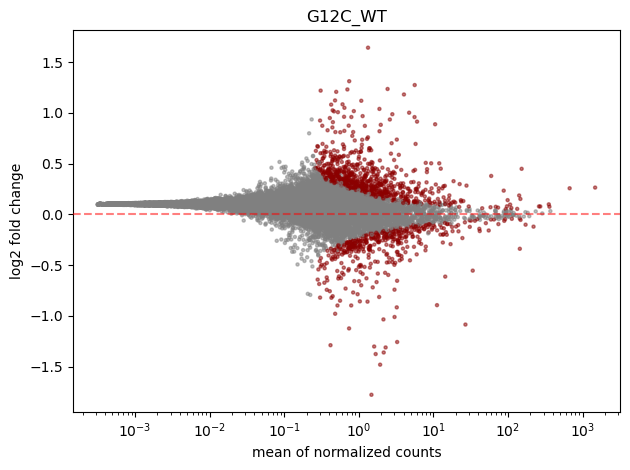

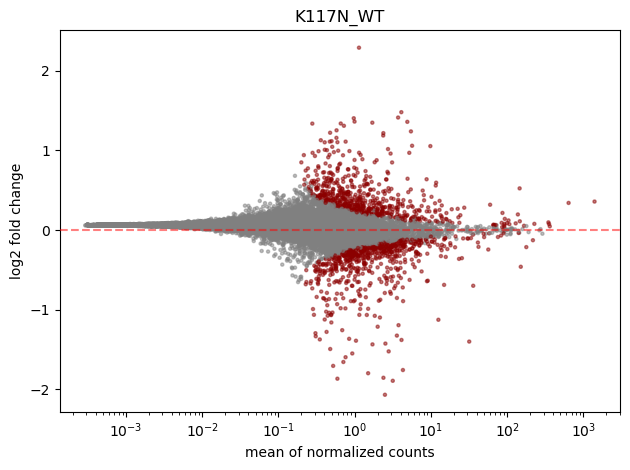

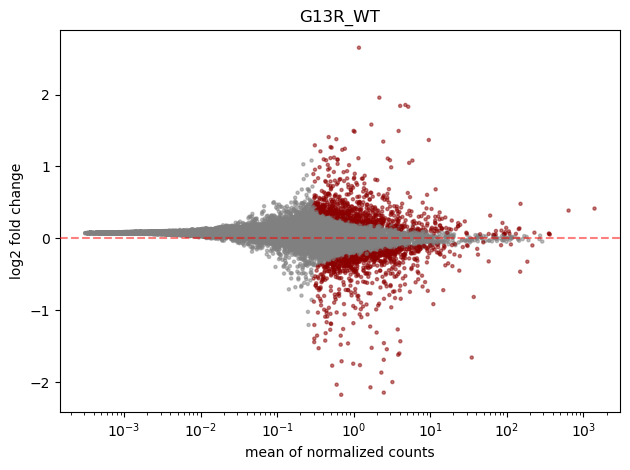

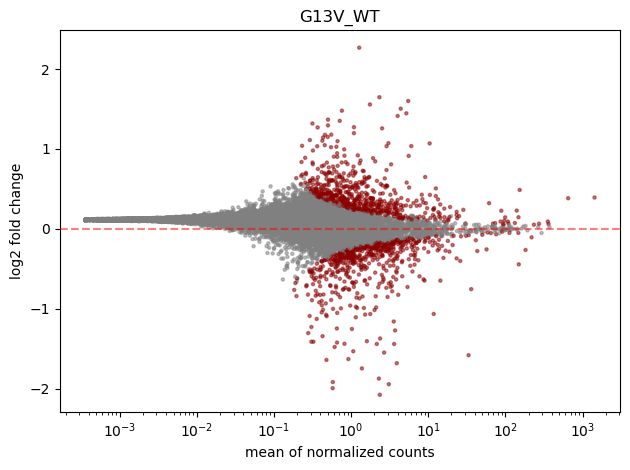

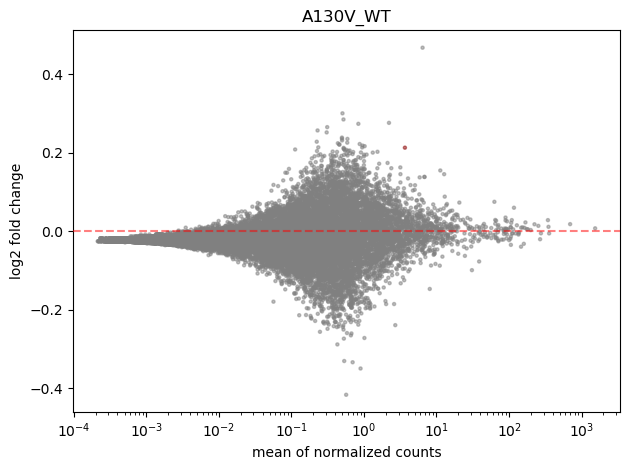

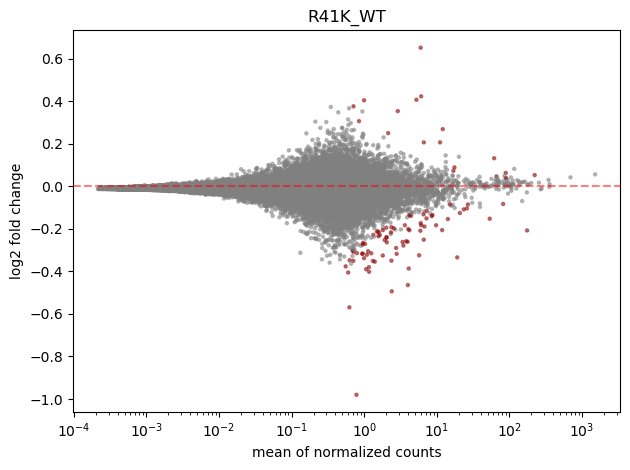

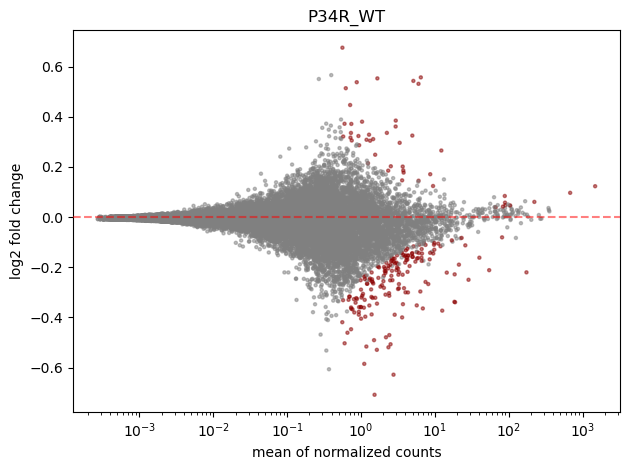

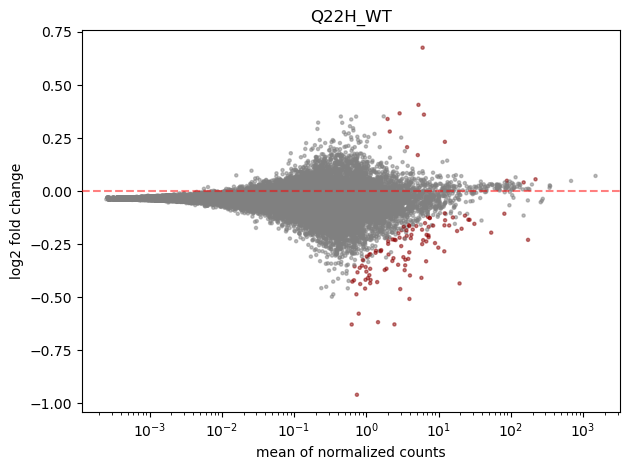

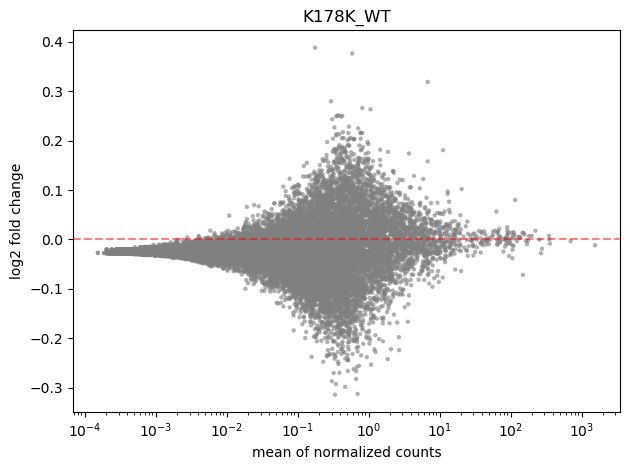

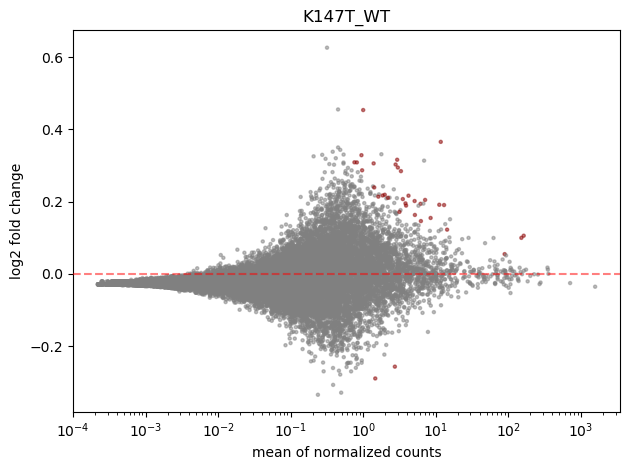

In [4]:
# Plotting the DEA
pseq.plot_dea(adata_dict)